# 导包

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.preprocessing import PowerTransformer , RobustScaler 
from scipy.stats import chi2_contingency
from sklearn.model_selection import train_test_split,GridSearchCV, PredefinedSplit,cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report,roc_curve, roc_auc_score, auc
import warnings
warnings.filterwarnings("ignore")
import shap
import xgboost as xgb
import optuna



In [2]:
plt.rcParams['font.sans-serif'] = ['Arial Unicode MS']  # 或者 'PingFang SC'
plt.rcParams['axes.unicode_minus'] = False

# 显示完整的 Dataframe
pd.set_option('display.max_columns', None) 

# 数据读取

In [3]:
data = pd.read_csv('train_data.csv')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1700 entries, 0 to 1699
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       1700 non-null   float64
 1   Attrition                 1700 non-null   int64  
 2   BusinessTravel            1700 non-null   float64
 3   DailyRate                 1700 non-null   float64
 4   Department                1700 non-null   float64
 5   DistanceFromHome          1700 non-null   float64
 6   Education                 1700 non-null   float64
 7   EducationField            1700 non-null   float64
 8   EmployeeCount             1700 non-null   float64
 9   EmployeeNumber            1700 non-null   float64
 10  EnvironmentSatisfaction   1700 non-null   float64
 11  Gender                    1700 non-null   float64
 12  HourlyRate                1700 non-null   float64
 13  JobInvolvement            1700 non-null   float64
 14  JobLevel

In [4]:
# 去除固定数值的冗余列
data.drop(axis=1, labels=['Over18','EmployeeCount','EmployeeNumber','StandardHours'],inplace=True)

In [5]:
data.columns, len(data.columns)

(Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
        'DistanceFromHome', 'Education', 'EducationField',
        'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
        'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
        'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
        'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
        'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
        'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
        'YearsSinceLastPromotion', 'YearsWithCurrManager'],
       dtype='object'),
 31)

# EDA 

In [6]:
categorical_feature = ['Attrition','BusinessTravel','Department','JobRole','JobLevel','Education','EducationField','Gender','MaritalStatus',
                       'EnvironmentSatisfaction','JobSatisfaction','RelationshipSatisfaction','WorkLifeBalance','PerformanceRating','OverTime','StockOptionLevel']
numerical_feature = [col for col in data.columns if col not in categorical_feature]
len(categorical_feature), len(numerical_feature)

(16, 15)

In [7]:
discrete_feature    = [col for col in numerical_feature if len(data[col].unique()) < 25]
continuous_feature  = [col for col in numerical_feature if col not in discrete_feature]
len(discrete_feature), len(continuous_feature)

(7, 8)

In [8]:
# 名义变量中去掉目标变量 Attrition
nominal_feature = ['Department','JobRole','EducationField','Gender','MaritalStatus','OverTime']

ordinal_feature = ['BusinessTravel','JobLevel','Education','EnvironmentSatisfaction','JobSatisfaction','RelationshipSatisfaction',
                   'WorkLifeBalance','PerformanceRating','StockOptionLevel']

len(categorical_feature), len(nominal_feature), len(ordinal_feature)

(16, 6, 9)

## 空值

In [9]:
data.isna().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSinceLastPromotion     0
YearsWithCurrManager        0
dtype: int64

## 数据分布

### 连续型变量

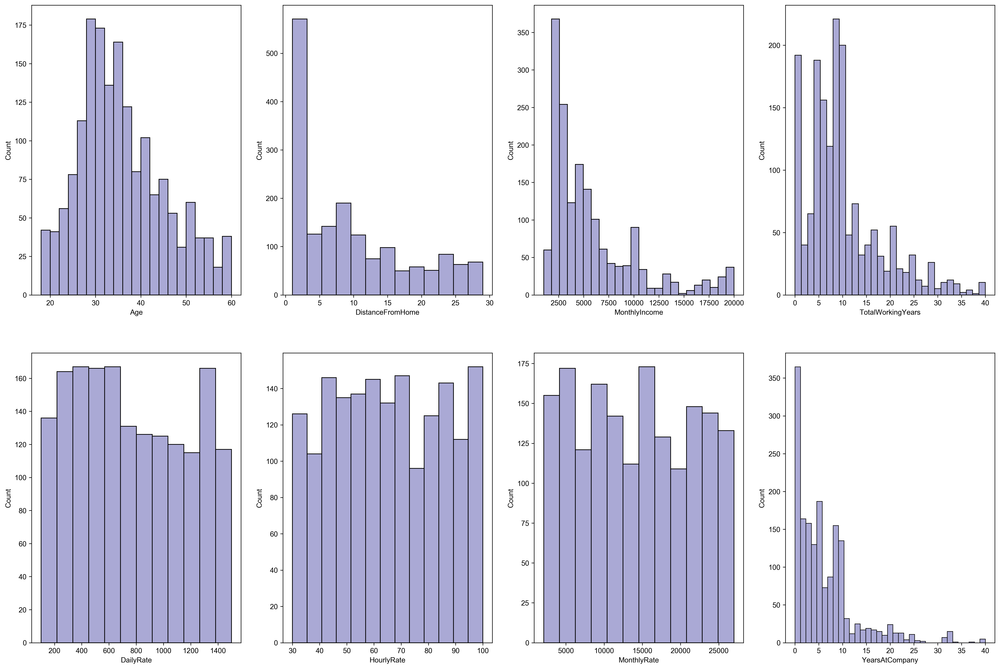

In [10]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(24, 16), dpi=300)

for i,feature in enumerate(continuous_feature):
    sns.histplot(data=data, x=feature, ax=axes[i%2,i//2], color=[142/255,141/255,200/255])

    DistanceFromHome,MonthlyIncome,TotalWorkingYears,YearsAtCompany

呈现着明显的偏态分布

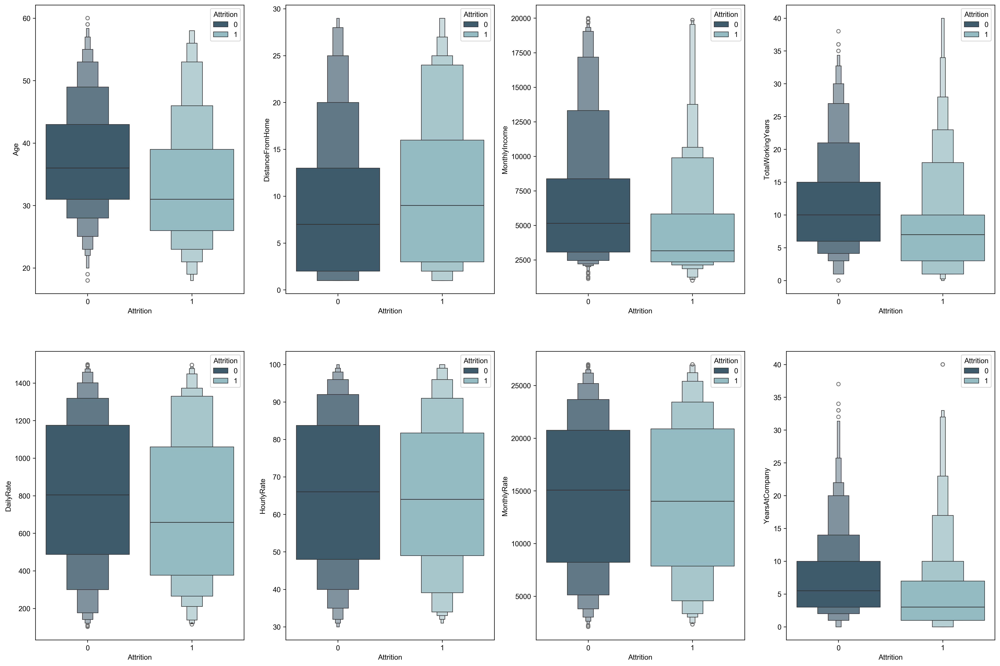

In [11]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(24, 16), dpi=300)

for i,feature in enumerate(continuous_feature):
    sns.boxenplot(data=data, x='Attrition', y=feature, hue='Attrition', ax=axes[i%2, i//2],palette=[[53/255,93/255,115/255],[141/255,192/255,200/255]]
)

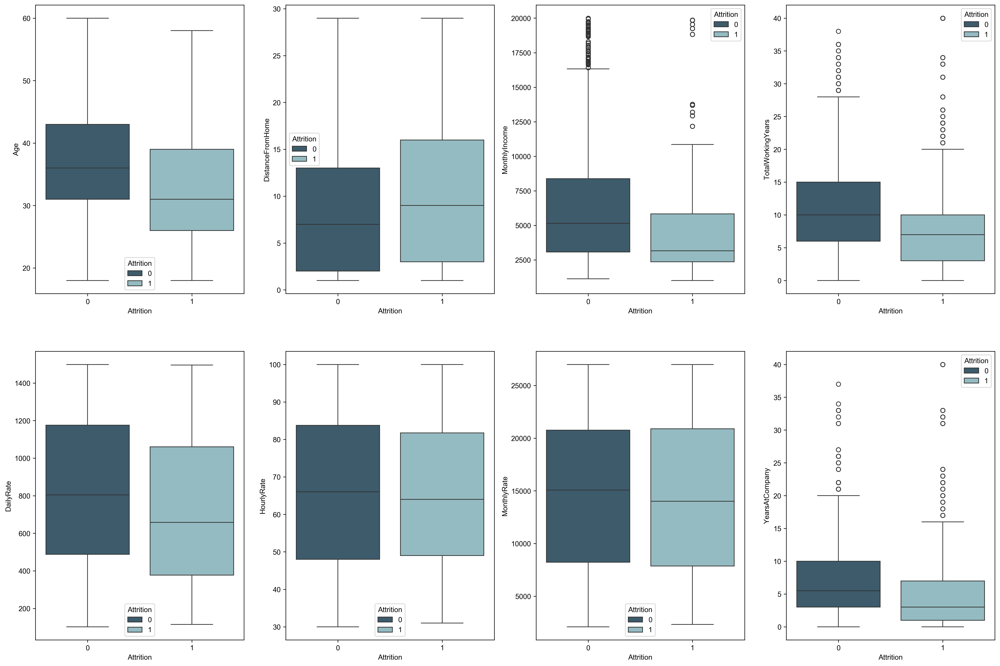

In [12]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(24, 16), dpi=300)

for i,feature in enumerate(continuous_feature):
    sns.boxplot(data=data, x='Attrition', y=feature, hue='Attrition', ax=axes[i%2, i//2],palette=[[53/255,93/255,115/255],[141/255,192/255,200/255]]
)

    HourlyRate,MonthlyRate

这两个变量的分布太过相似，考虑删去 时薪和月薪，数据集中仍存在 日薪 特征可使用

### 离散型变量

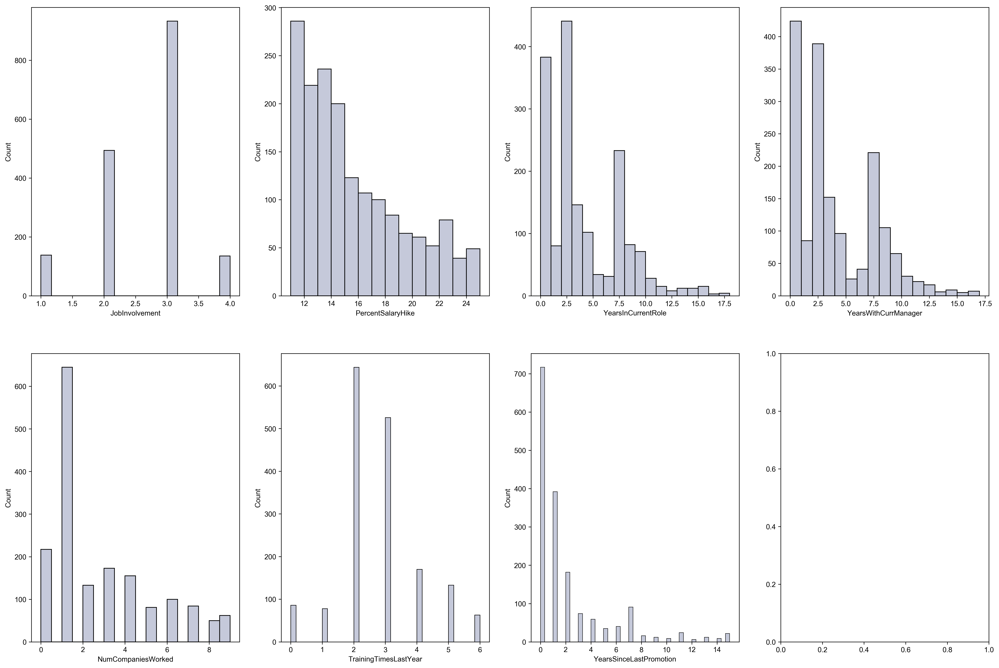

In [13]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(24, 16), dpi=300)

for i,feature in enumerate(discrete_feature):
    sns.histplot(data=data, x=feature, ax=axes[i%2, i//2], color=[65/255,76/255,135/255],alpha=0.3)

离散变量的分布与正态分布差距过大，考虑使用Robust标准化

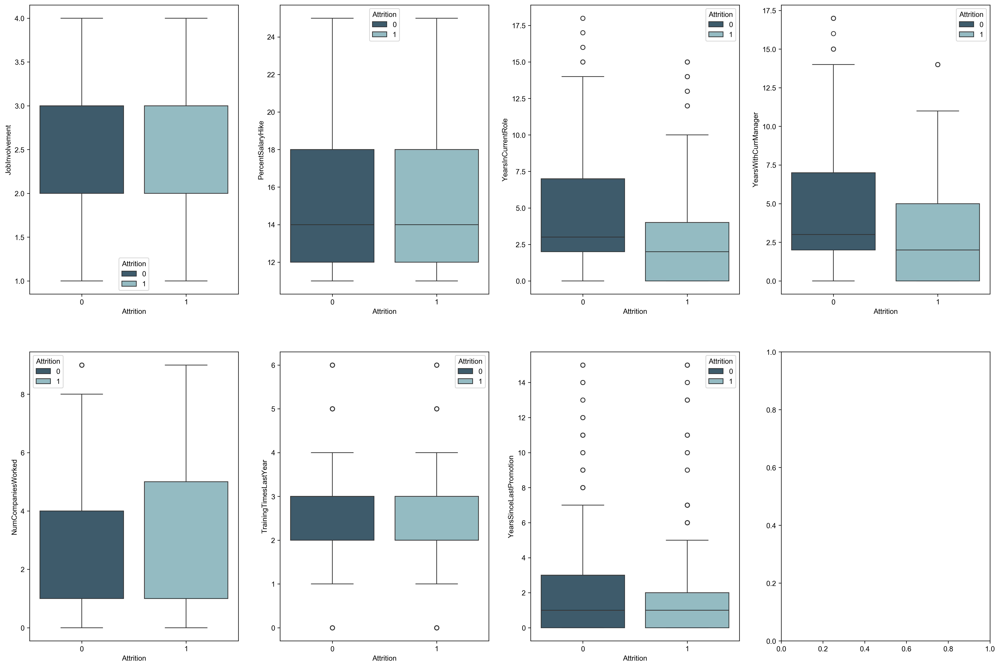

In [14]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(24, 16), dpi=300)

for i,feature in enumerate(discrete_feature):
    sns.boxplot(data=data, x='Attrition', y=feature, hue='Attrition', ax=axes[i%2, i//2],palette=[[53/255,93/255,115/255],[141/255,192/255,200/255]]
)

    JobInvolvement,PercentSalaryHike,TrainingTimesLastYear

同样考虑删去

### 名义型变量

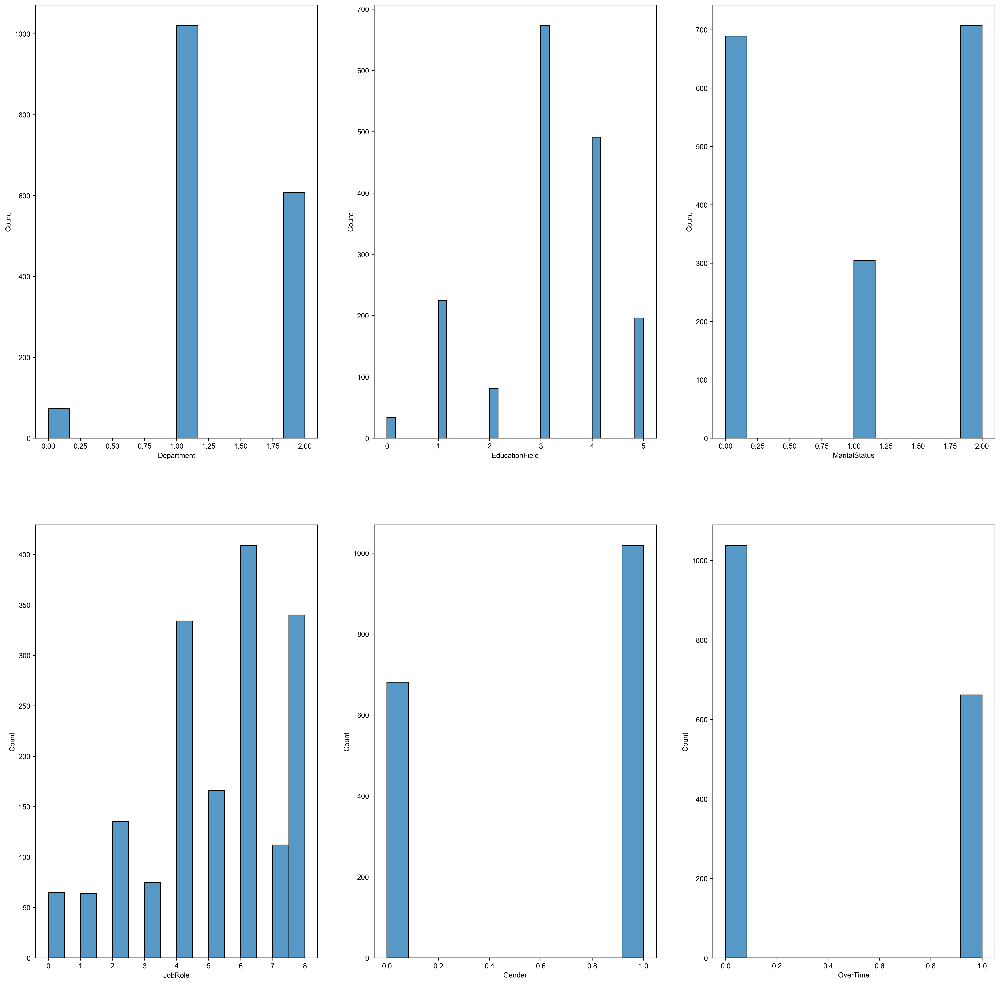

In [15]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24, 24), dpi=300)

for i, feature in enumerate(nominal_feature):
    sns.histplot(data=data, x=feature, ax=axes[i%2, i//2])


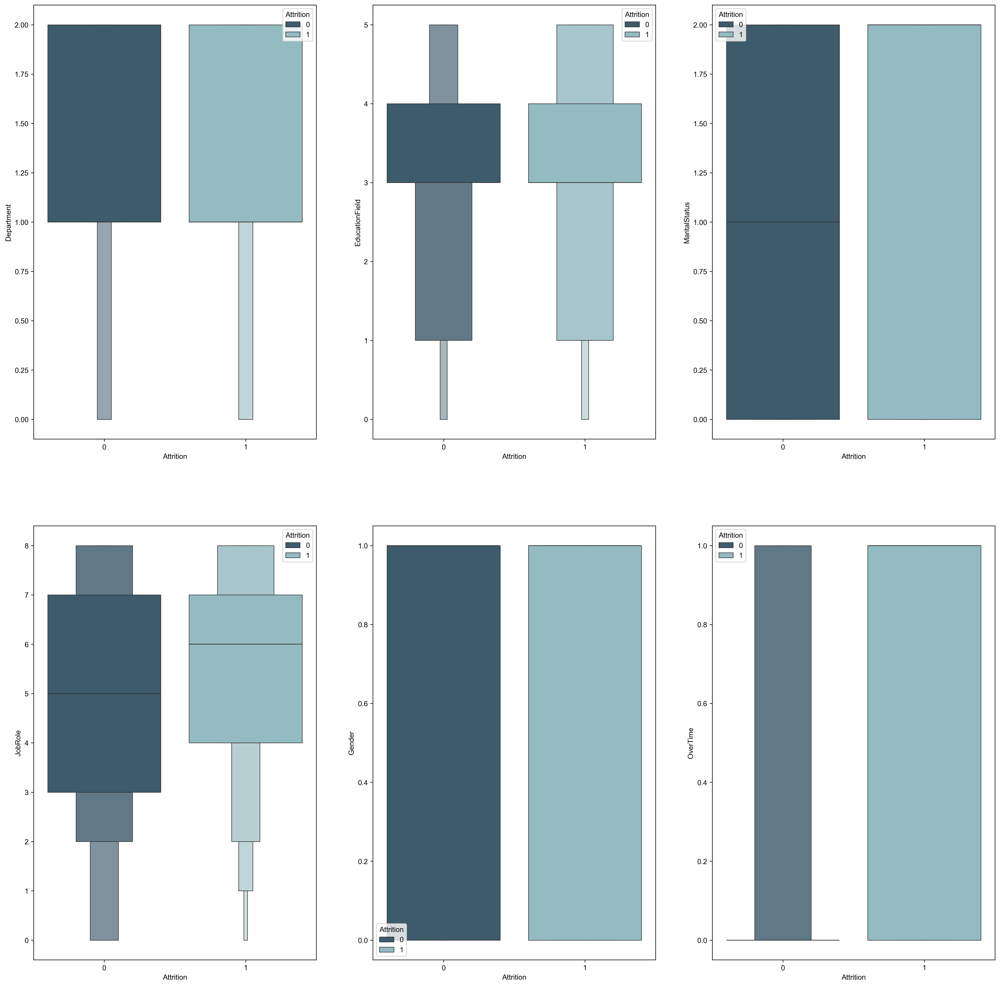

In [16]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24, 24), dpi=300)

for i, feature in enumerate(nominal_feature):
    sns.boxenplot(data=data, x='Attrition', y=feature, hue='Attrition', ax=axes[i%2, i//2], palette=[[53/255,93/255,115/255],[141/255,192/255,200/255]])



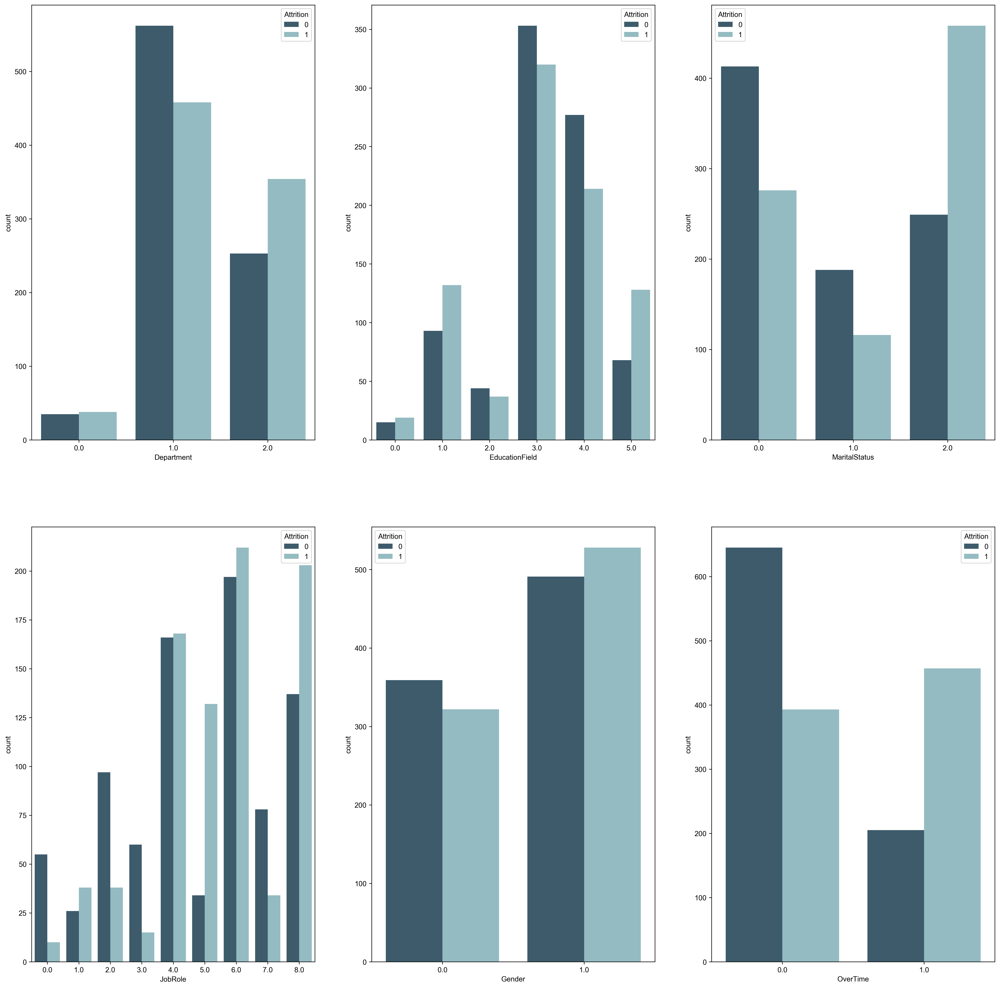

In [17]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24, 24), dpi=300)

for i, feature in enumerate(nominal_feature):
    sns.countplot(data=data, x=feature, hue='Attrition' ,ax=axes[i%2, i//2], palette=[[53/255,93/255,115/255],[141/255,192/255,200/255]])


    Department, Gender

删去

### 有序型变量

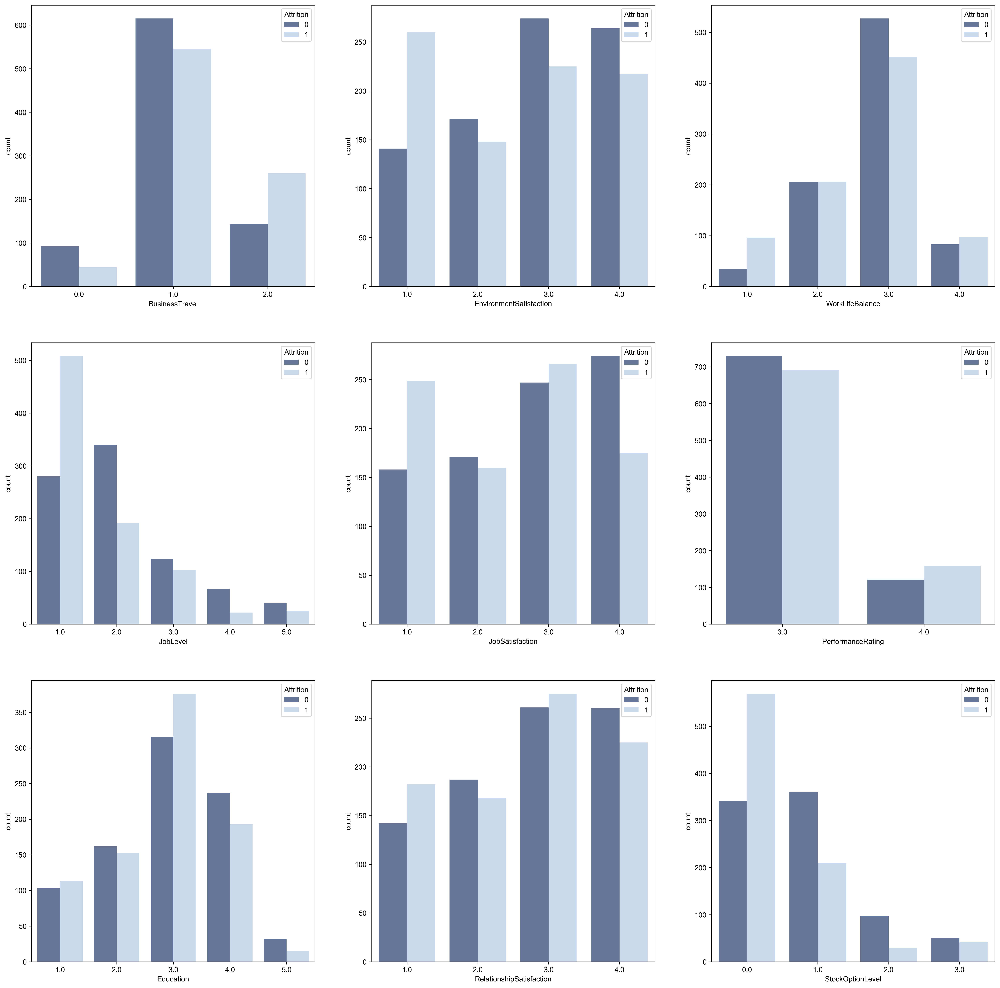

In [18]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(24, 24), dpi=300)

for i,feature in enumerate(ordinal_feature):
    ax = axes[i%3, i//3]
    sns.countplot(data=data, x=feature, hue='Attrition', ax=ax,
                palette=[[93/255,116/255,162/255], [196/255,216/255,242/255]])

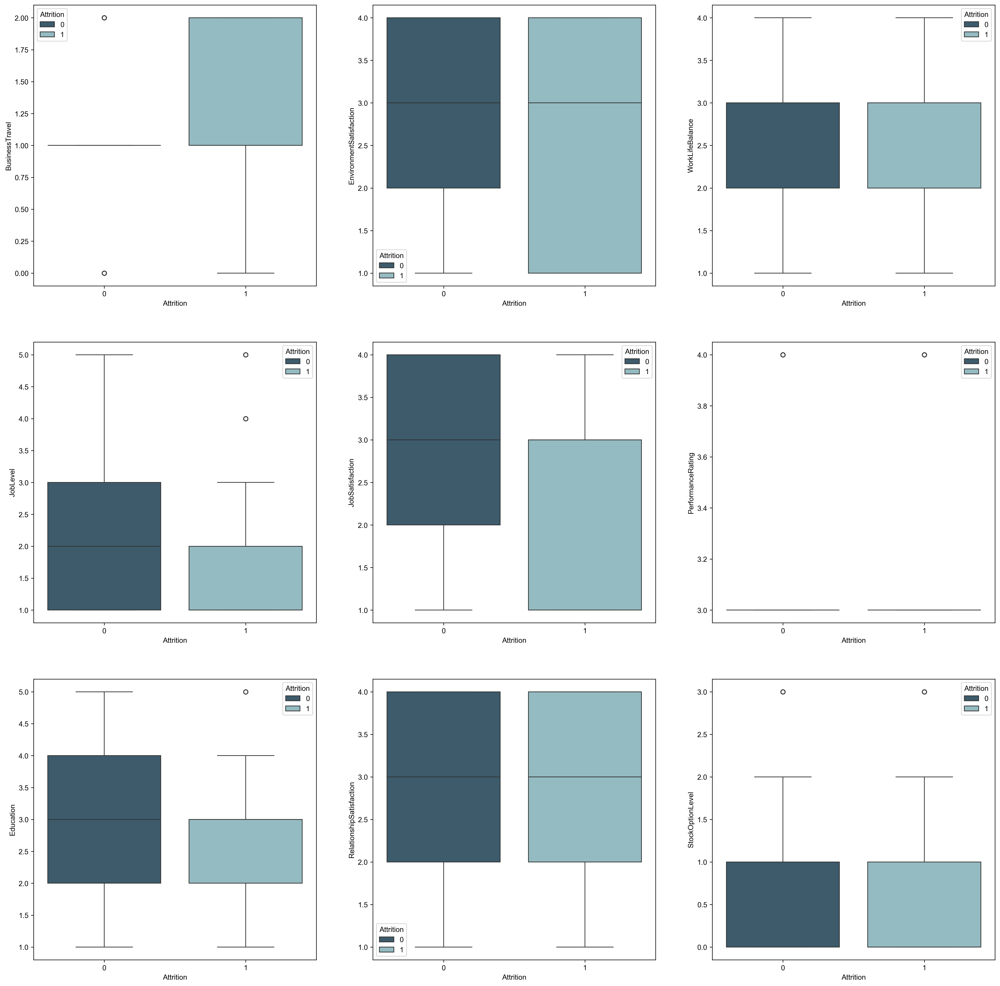

In [19]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(24, 24), dpi=300)

for i, feature in enumerate(ordinal_feature):
    sns.boxplot(data=data, x='Attrition', y=feature, hue='Attrition', ax=axes[i%3, i//3], palette=[[53/255,93/255,115/255],[141/255,192/255,200/255]])



    BusinessTravel,PerformanceRating,Education

其趋势很相似，删去



In [20]:
drop_cols = ['BusinessTravel','PerformanceRating','Education','Department', 'Gender',
             'JobInvolvement','PercentSalaryHike','TrainingTimesLastYear','HourlyRate','MonthlyRate']
data.drop(labels=drop_cols, axis=1, inplace=True)

## 相关性分析

In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1700 entries, 0 to 1699
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       1700 non-null   float64
 1   Attrition                 1700 non-null   int64  
 2   DailyRate                 1700 non-null   float64
 3   DistanceFromHome          1700 non-null   float64
 4   EducationField            1700 non-null   float64
 5   EnvironmentSatisfaction   1700 non-null   float64
 6   JobLevel                  1700 non-null   float64
 7   JobRole                   1700 non-null   float64
 8   JobSatisfaction           1700 non-null   float64
 9   MaritalStatus             1700 non-null   float64
 10  MonthlyIncome             1700 non-null   float64
 11  NumCompaniesWorked        1700 non-null   float64
 12  OverTime                  1700 non-null   float64
 13  RelationshipSatisfaction  1700 non-null   float64
 14  StockOpt

### 数值型变量

In [22]:
numerical_cols = list(
    set(numerical_feature) - set(['JobInvolvement','PercentSalaryHike','TrainingTimesLastYear','HourlyRate','MonthlyRate'])
)
numerical_cols

['YearsAtCompany',
 'Age',
 'YearsSinceLastPromotion',
 'DistanceFromHome',
 'DailyRate',
 'MonthlyIncome',
 'YearsInCurrentRole',
 'YearsWithCurrManager',
 'NumCompaniesWorked',
 'TotalWorkingYears']

<Axes: >

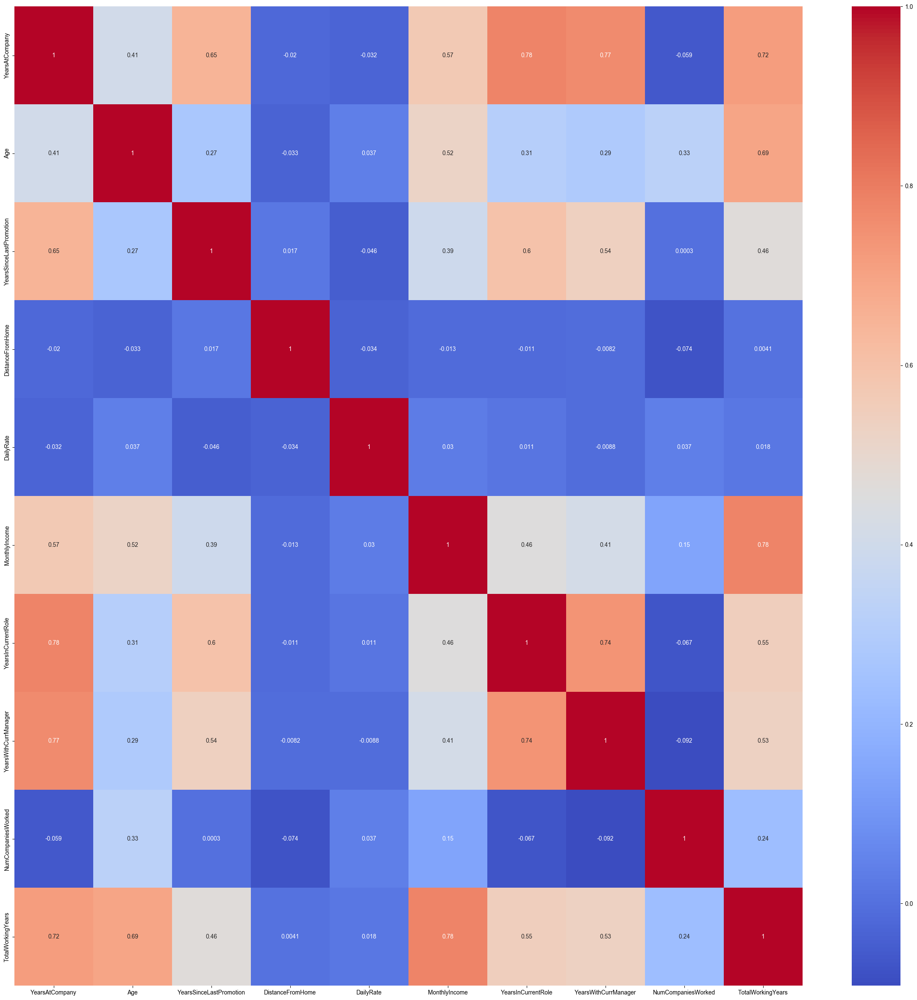

In [23]:
numeric_data = pd.DataFrame()

for feature in numerical_cols:
    numeric_data[feature] = data[feature]

#==================================================
###     注意这里是 皮尔逊 —— pearson
#==================================================
corr_data = numeric_data.corr(method='pearson')

plt.figure(figsize=(30,30))
sns.heatmap(data= corr_data, cmap='coolwarm', annot=True, fmt='.2g')

<font size=5>假定相关系数大于等于 0.75 时具有比较强的相关性</font>

可见， 

    MonthlyIncome 与 TotalWorkingYears —— 0.78

    YearsAtCompany 与 YearsinCurrentRole —— 0.78

    YearsAtCompany 与 YearsWithCurrManager —— 0.77

In [24]:
data[['MonthlyIncome','DailyRate']].describe()

,MonthlyIncome,DailyRate
count,1700.000000,1700.000000
mean,5801.655294,769.514706
std,4424.254970,405.024044
min,1009.000000,102.000000
25%,2579.750000,427.000000
50%,4396.500000,722.500000
75%,7314.000000,1125.000000
max,19999.000000,1499.000000


为消除相关性， 考虑删去 MonthlyIncome 这一列，用 DailyRate 表示收入水平

In [25]:
data['JobStability'] = data['YearsInCurrentRole'] / data['YearsAtCompany']
data['LeaderTurnRate'] = data['YearsAtCompany'] - data['YearsWithCurrManager'] 

In [26]:
data['JobStability'].fillna(value=0,inplace=True)
data.isna().sum()

Age                         0
Attrition                   0
DailyRate                   0
DistanceFromHome            0
EducationField              0
EnvironmentSatisfaction     0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
NumCompaniesWorked          0
OverTime                    0
RelationshipSatisfaction    0
StockOptionLevel            0
TotalWorkingYears           0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSinceLastPromotion     0
YearsWithCurrManager        0
JobStability                0
LeaderTurnRate              0
dtype: int64

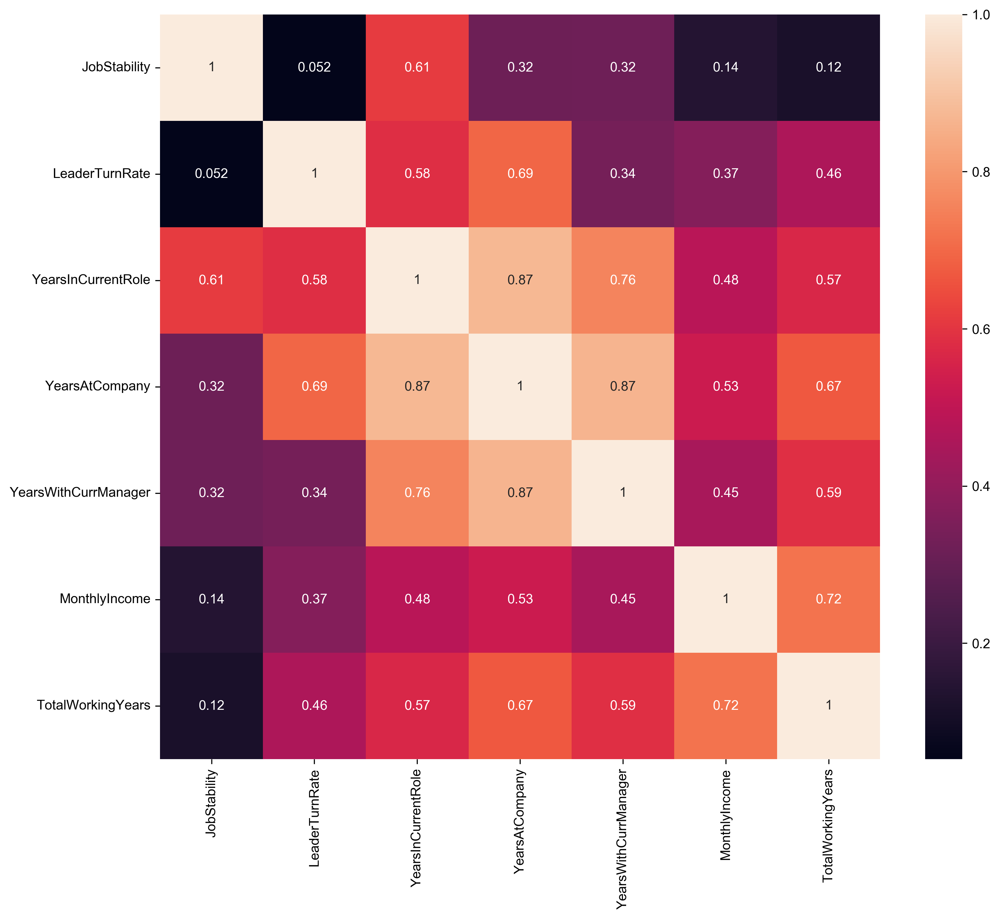

In [27]:
multi = data[['JobStability', 'LeaderTurnRate','YearsInCurrentRole','YearsAtCompany','YearsWithCurrManager',
               'MonthlyIncome','TotalWorkingYears' ]]
multiq = multi.corr(method='spearman')

plt.figure(figsize=(12,10),dpi=300)
sns.heatmap(data=multiq, annot=True, fmt='.2g')
plt.show()


In [28]:
multi_corr = ['YearsInCurrentRole','YearsAtCompany','YearsWithCurrManager','MonthlyIncome','TotalWorkingYears']

data.drop(labels= multi_corr, axis=1, inplace=True )

data.head()

,Age,Attrition,DailyRate,DistanceFromHome,EducationField,EnvironmentSatisfaction,JobLevel,JobRole,JobSatisfaction,MaritalStatus,NumCompaniesWorked,OverTime,RelationshipSatisfaction,StockOptionLevel,WorkLifeBalance,YearsSinceLastPromotion,JobStability,LeaderTurnRate
0,37.0,0,558.0,2.0,1.0,4.0,2.0,6.0,3.0,0.0,4.0,1.0,3.0,1.0,2.0,1.0,0.000000,3.0
1,33.0,0,1038.0,8.0,3.0,2.0,1.0,5.0,4.0,2.0,0.0,0.0,4.0,0.0,2.0,2.0,1.000000,0.0
2,45.0,0,1015.0,5.0,4.0,3.0,2.0,8.0,1.0,2.0,1.0,1.0,1.0,0.0,3.0,1.0,0.700000,6.0
3,36.0,0,164.0,2.0,4.0,2.0,3.0,6.0,3.0,0.0,1.0,0.0,2.0,2.0,3.0,9.0,0.900000,10.0
4,44.0,0,477.0,7.0,4.0,1.0,3.0,7.0,4.0,0.0,3.0,0.0,4.0,1.0,3.0,5.0,0.272727,5.0


### 有序型变量

In [29]:
ordinal_cols = list(
    set(ordinal_feature) - set(['BusinessTravel','PerformanceRating','Education'])
)

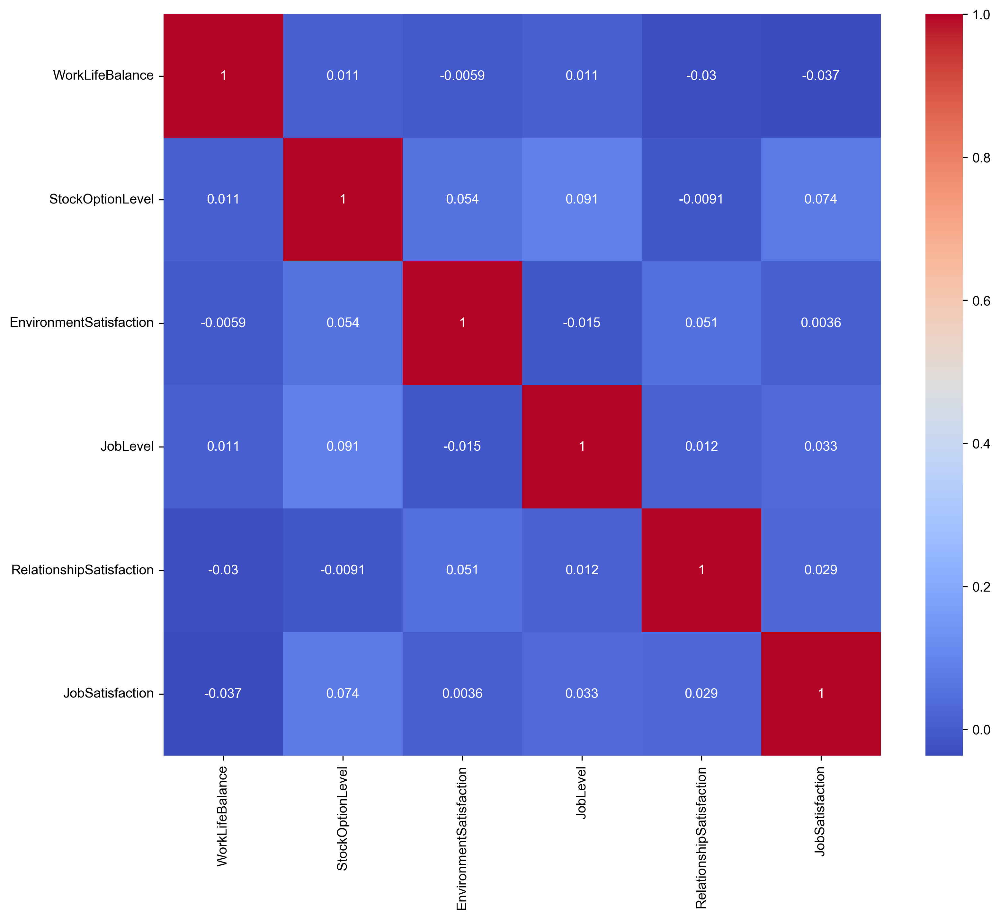

In [30]:
#==================================================
###     注意这里是  Spearman
#==================================================
spearman_corr = data[ordinal_cols].corr(method='spearman')

plt.figure(figsize=(12,10),dpi=300)
sns.heatmap(data= spearman_corr, cmap='coolwarm', annot=True, fmt='.2g')
plt.show()

## 关联性分析

In [31]:
nominal_cols = list(
    set(nominal_feature) - set(['Department','Gender'])
)

In [32]:
def cramers_v(confusion_matrix):
    """
    计算 Cramer's V 值。confusion_matrix 为列联表，
    返回的 V 值范围 [0, 1]，数值越大表示两个变量之间的关联程度越高。
    """
    # 卡方统计量、p 值、自由度和期望频数
    chi2, _, _, _ = chi2_contingency(confusion_matrix)
    n = confusion_matrix.to_numpy().sum()  # 样本总数
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    # 避免除零错误，取较小的自由度
    denom = min(k - 1, r - 1)
    if denom == 0:
        return np.nan
    return np.sqrt(phi2 / denom)

In [33]:
# 创建一个空的 DataFrame 用来存储 Cramer’s V 值矩阵（对称矩阵）
n = len(nominal_cols)
cramers_v_matrix = pd.DataFrame(np.zeros((n, n)), index=nominal_cols, columns=nominal_cols)

# 两两计算名义变量间的 Cramer’s V
for i in range(n):
    for j in range(i, n):
        if i == j:
            # 同一变量的相关性为 1
            cramers_v_matrix.iloc[i, j] = 1.0
        else:
            feat1 = nominal_cols[i]
            feat2 = nominal_cols[j]
            # 构造列联表
            contingency_table = pd.crosstab(data[feat1], data[feat2])
            # 计算 Cramer’s V
            cv = cramers_v(contingency_table)
            cramers_v_matrix.iloc[i, j] = cv
            cramers_v_matrix.iloc[j, i] = cv  # 填充对称位置

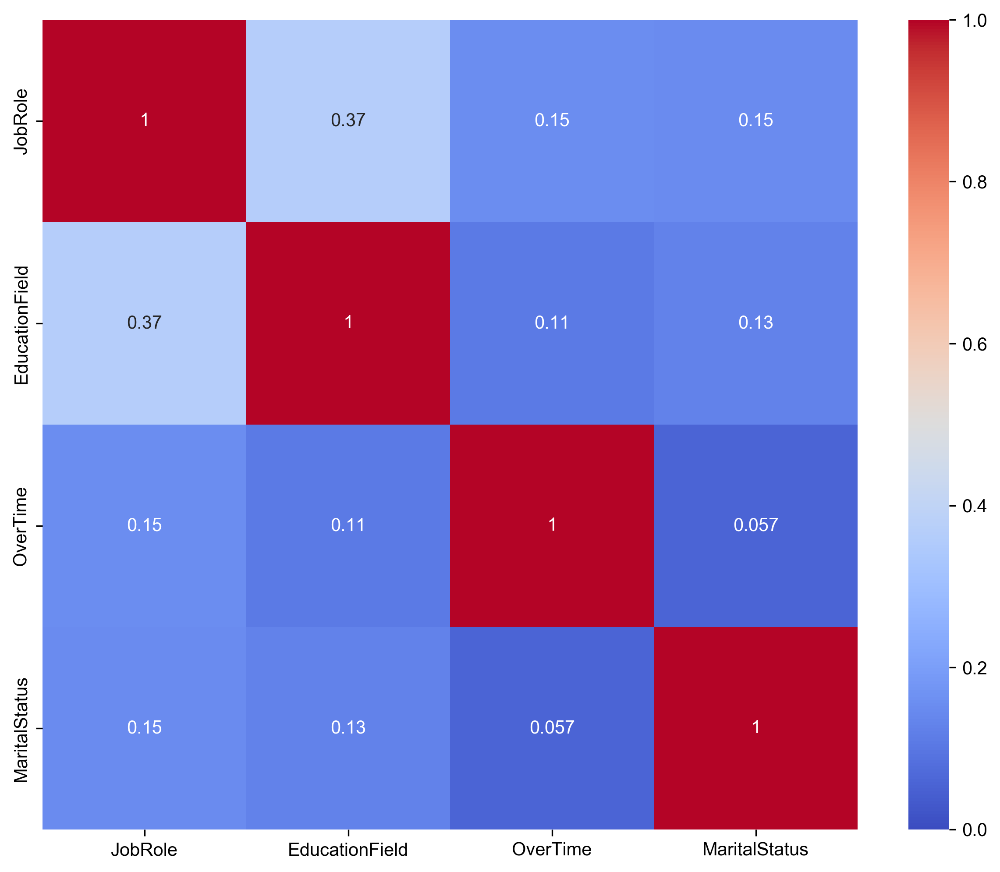

In [34]:
plt.figure(figsize=(10, 8),dpi=300)
sns.heatmap(cramers_v_matrix, annot=True, cmap='coolwarm', vmin=0, vmax=1)
plt.show()

# 数据清洗

检验异常值

In [35]:
data.describe()

,Age,Attrition,DailyRate,DistanceFromHome,EducationField,EnvironmentSatisfaction,JobLevel,JobRole,JobSatisfaction,MaritalStatus,NumCompaniesWorked,OverTime,RelationshipSatisfaction,StockOptionLevel,WorkLifeBalance,YearsSinceLastPromotion,JobStability,LeaderTurnRate
count,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000
mean,35.417059,0.500000,769.514706,9.666471,3.147059,2.623529,1.888235,5.107647,2.590588,1.010588,2.706471,0.389412,2.695294,0.647647,2.710000,2.082353,0.532751,2.734118
std,9.486191,0.500147,405.024044,8.266524,1.219142,1.128333,1.066026,2.222908,1.117850,0.906393,2.512421,0.487760,1.079032,0.839694,0.756385,3.212915,0.354105,4.324113
min,18.000000,0.000000,102.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,29.000000,0.000000,427.000000,2.000000,3.000000,2.000000,1.000000,4.000000,2.000000,0.000000,1.000000,0.000000,2.000000,0.000000,2.000000,0.000000,0.200000,1.000000
50%,34.000000,0.500000,722.500000,8.000000,3.000000,3.000000,2.000000,6.000000,3.000000,1.000000,1.000000,0.000000,3.000000,0.000000,3.000000,1.000000,0.666667,1.000000
75%,41.000000,1.000000,1125.000000,15.000000,4.000000,4.000000,2.000000,7.000000,4.000000,2.000000,4.000000,1.000000,4.000000,1.000000,3.000000,2.000000,0.800000,3.000000
max,60.000000,1.000000,1499.000000,29.000000,5.000000,4.000000,5.000000,8.000000,4.000000,2.000000,9.000000,1.000000,4.000000,3.000000,4.000000,15.000000,1.000000,34.000000


# 数据变换

## 划分数据集

In [36]:
train, val = train_test_split(data, test_size=0.2, random_state=123)
train.shape, val.shape

((1360, 18), (340, 18))

## 偏态分布

In [37]:
continuous_cols = list(
    set(continuous_feature) - set(['HourlyRate','MonthlyRate','MonthlyIncome', 'TotalWorkingYears', 'YearsAtCompany']) 
)
continuous_cols = list(
    set(continuous_cols).union({'JobStability', 'LeaderTurnRate'})
)

continuous_cols

['Age', 'LeaderTurnRate', 'DistanceFromHome', 'DailyRate', 'JobStability']

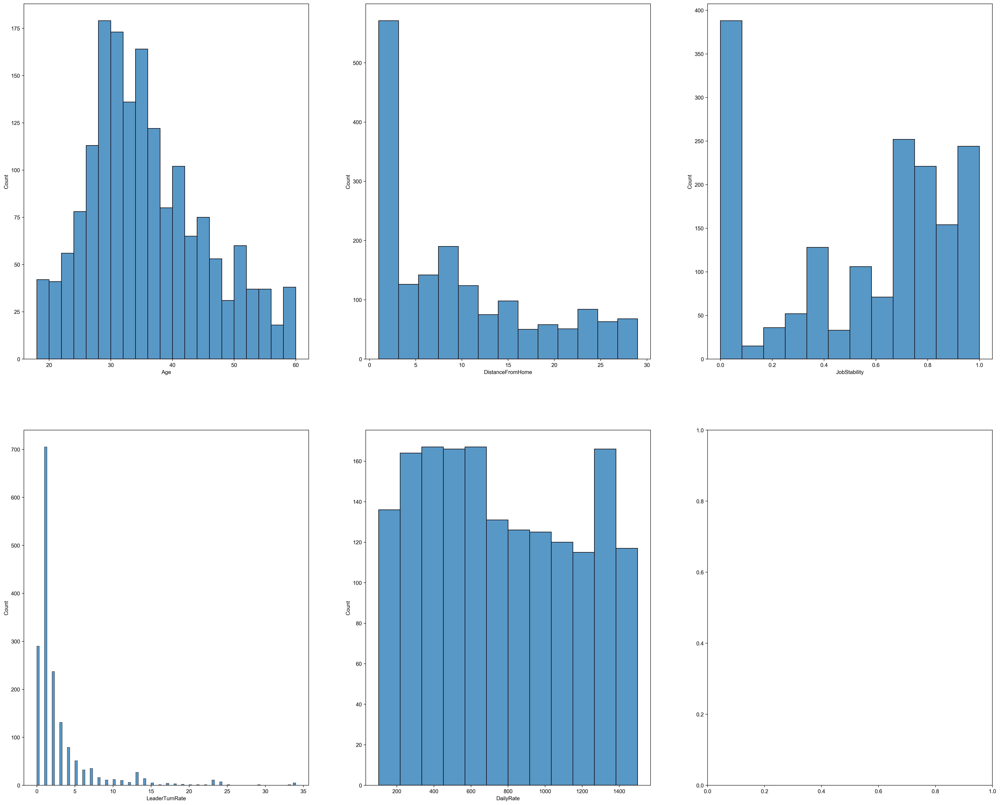

In [38]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(32, 26), dpi=300)

for i,feature in enumerate(continuous_cols):
    sns.histplot(data=data, x=feature, ax=axes[i%2,i//2])


计算偏度

In [39]:
transform_data = data[continuous_cols]
skewness = transform_data.skew().sort_values(ascending=False)

skewness

LeaderTurnRate      3.597622
DistanceFromHome    0.816545
Age                 0.541474
DailyRate           0.162928
JobStability       -0.361466
dtype: float64

对偏度大于 1 或者小于 -1 的变量进行转换 

In [40]:
yeo_johnson = PowerTransformer(method='yeo-johnson', standardize=True, copy=True)

# 防止数据泄露分开处理
train[['LeaderTurnRate']] = yeo_johnson.fit_transform(train[['LeaderTurnRate']])
val[['LeaderTurnRate']] = yeo_johnson.fit_transform(val[['LeaderTurnRate']])

可视化转换结果

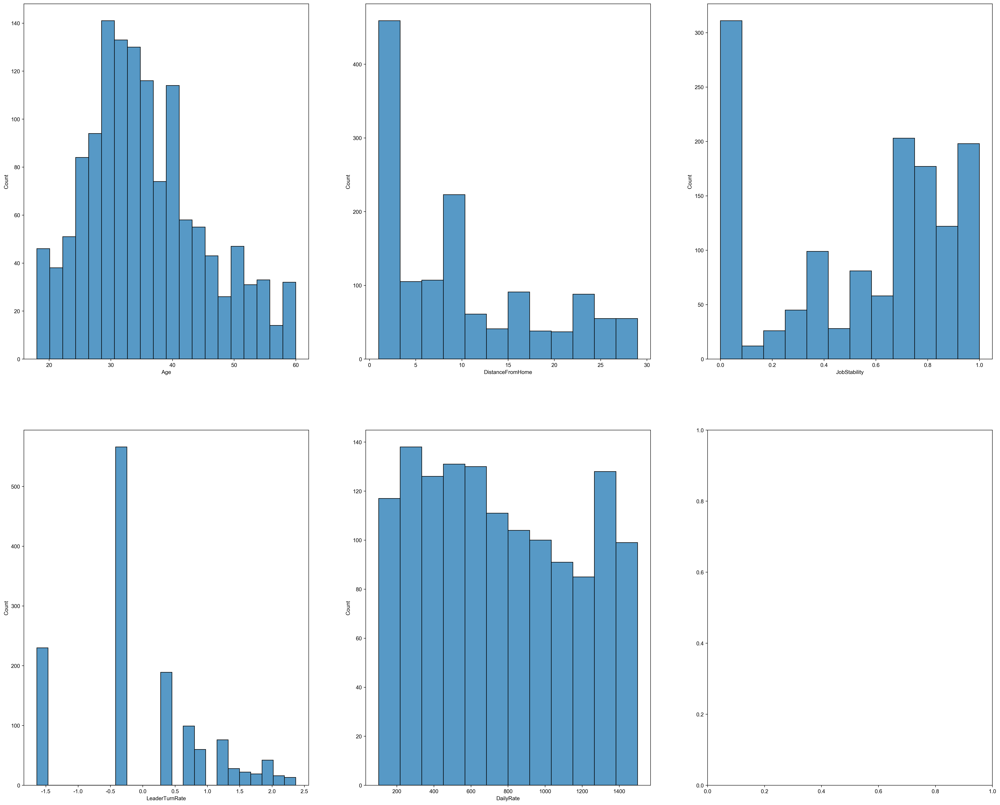

In [41]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(32, 26), dpi=300)

for i,feature in enumerate(continuous_cols):
    sns.histplot(data=train, x=feature, ax=axes[i%2,i//2])


## 标准化

对于存在较多异常值且不服从正态分布的特征，使用 鲁棒标准化（Robust Scaling）

对于接近正态分布的特征，使用 Z-score 标准化（Z-score Normalization）

In [42]:
numerical_ = [col for col in numerical_cols if col not in ['YearsWithCurrManager', 'MonthlyIncome', 'TotalWorkingYears', 'YearsInCurrentRole', 'YearsAtCompany']]

numerical_

['Age',
 'YearsSinceLastPromotion',
 'DistanceFromHome',
 'DailyRate',
 'NumCompaniesWorked']

In [43]:
train.head()

,Age,Attrition,DailyRate,DistanceFromHome,EducationField,EnvironmentSatisfaction,JobLevel,JobRole,JobSatisfaction,MaritalStatus,NumCompaniesWorked,OverTime,RelationshipSatisfaction,StockOptionLevel,WorkLifeBalance,YearsSinceLastPromotion,JobStability,LeaderTurnRate
938,19.0,1,504.0,10.0,4.0,1.0,1.0,4.0,2.0,2.0,1.0,1.0,2.0,0.0,4.0,0.0,1.000000,-0.278631
798,38.0,0,330.0,17.0,3.0,3.0,3.0,7.0,3.0,0.0,0.0,0.0,1.0,1.0,2.0,1.0,0.473684,1.686984
666,31.0,0,655.0,7.0,3.0,4.0,2.0,8.0,4.0,1.0,3.0,0.0,4.0,1.0,2.0,1.0,1.000000,-1.638788
5,29.0,0,1404.0,20.0,5.0,3.0,1.0,5.0,4.0,0.0,1.0,0.0,2.0,1.0,3.0,0.0,0.333333,-0.278631
1101,33.0,0,1242.0,8.0,3.0,1.0,2.0,6.0,1.0,0.0,2.0,0.0,4.0,1.0,1.0,2.0,1.000000,-1.638788


In [44]:
# ROBUST SCALING NORM
robust = RobustScaler()
robust.fit(train[numerical_])
train[numerical_] = robust.transform(train[numerical_])

robust = RobustScaler()
robust.fit(val[numerical_])
val[numerical_] = robust.transform(val[numerical_])

# 特征工程

## One-Hot

In [45]:
categorical_cols = list(set(categorical_feature)-set(['Attrition','BusinessTravel', 'Department', 'Education', 'Gender', 'PerformanceRating']))
data[categorical_cols].head()

,EducationField,WorkLifeBalance,OverTime,StockOptionLevel,JobRole,EnvironmentSatisfaction,JobLevel,RelationshipSatisfaction,MaritalStatus,JobSatisfaction
0,1.0,2.0,1.0,1.0,6.0,4.0,2.0,3.0,0.0,3.0
1,3.0,2.0,0.0,0.0,5.0,2.0,1.0,4.0,2.0,4.0
2,4.0,3.0,1.0,0.0,8.0,3.0,2.0,1.0,2.0,1.0
3,4.0,3.0,0.0,2.0,6.0,2.0,3.0,2.0,0.0,3.0
4,4.0,3.0,0.0,1.0,7.0,1.0,3.0,4.0,0.0,4.0


In [46]:
train_onehot = pd.get_dummies(data=train ,prefix=categorical_cols, columns=categorical_cols, dtype=int)
val_onehot = pd.get_dummies(data=val ,prefix=categorical_cols, columns=categorical_cols, dtype=int)

train_onehot.head()

,Age,Attrition,DailyRate,DistanceFromHome,NumCompaniesWorked,YearsSinceLastPromotion,JobStability,LeaderTurnRate,EducationField_0.0,EducationField_1.0,EducationField_2.0,EducationField_3.0,EducationField_4.0,EducationField_5.0,WorkLifeBalance_1.0,WorkLifeBalance_2.0,WorkLifeBalance_3.0,WorkLifeBalance_4.0,OverTime_0.0,OverTime_1.0,StockOptionLevel_0.0,StockOptionLevel_1.0,StockOptionLevel_2.0,StockOptionLevel_3.0,JobRole_0.0,JobRole_1.0,JobRole_2.0,JobRole_3.0,JobRole_4.0,JobRole_5.0,JobRole_6.0,JobRole_7.0,JobRole_8.0,EnvironmentSatisfaction_1.0,EnvironmentSatisfaction_2.0,EnvironmentSatisfaction_3.0,EnvironmentSatisfaction_4.0,JobLevel_1.0,JobLevel_2.0,JobLevel_3.0,JobLevel_4.0,JobLevel_5.0,RelationshipSatisfaction_1.0,RelationshipSatisfaction_2.0,RelationshipSatisfaction_3.0,RelationshipSatisfaction_4.0,MaritalStatus_0.0,MaritalStatus_1.0,MaritalStatus_2.0,JobSatisfaction_1.0,JobSatisfaction_2.0,JobSatisfaction_3.0,JobSatisfaction_4.0
938,-1.250000,1,-0.302210,0.153846,-0.166667,-0.5,1.000000,-0.278631,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0
798,0.333333,0,-0.550249,0.692308,-0.500000,0.0,0.473684,1.686984,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0
666,-0.250000,0,-0.086957,-0.076923,0.500000,0.0,1.000000,-1.638788,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1
5,-0.416667,0,0.980756,0.923077,-0.166667,-0.5,0.333333,-0.278631,0,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1
1101,-0.083333,0,0.749822,0.000000,0.166667,0.5,1.000000,-1.638788,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0,0


## Bin

In [47]:
numerical_bins = list(
    set(numerical_).union({'JobStability','LeaderTurnRate'})
)
numerical_bins

['Age',
 'YearsSinceLastPromotion',
 'LeaderTurnRate',
 'DistanceFromHome',
 'DailyRate',
 'NumCompaniesWorked',
 'JobStability']

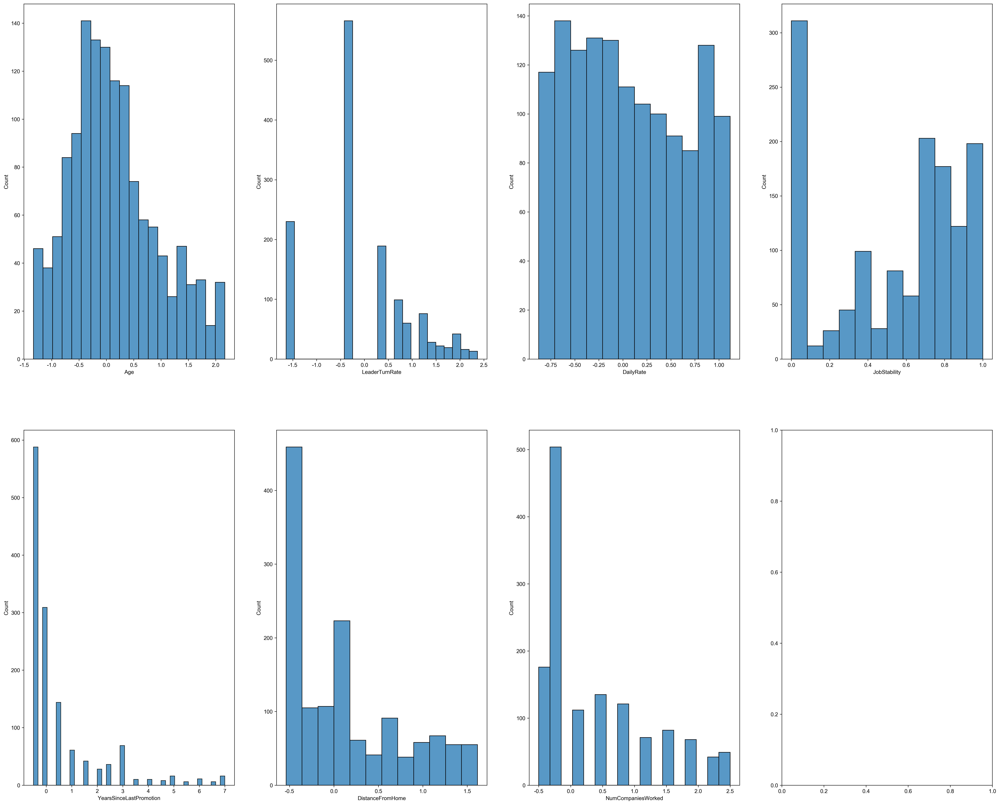

In [48]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(32, 26), dpi=300)

for i,feature in enumerate(numerical_bins):
    sns.histplot(data=train, x=feature, ax=axes[i%2,i//2])


我还未想到合适的分箱策略，暂时先不分箱

# Logistic

In [49]:
train_X = train_onehot.drop(columns='Attrition')    
train_y = train_onehot['Attrition']                

val_X   = val_onehot.drop(columns='Attrition')     
val_y   = val_onehot['Attrition']

# 合并数据集
X_all = np.vstack([train_X, val_X])
y_all = np.concatenate([train_y, val_y])

X_all.shape, y_all.shape

((1700, 52), (1700,))

In [50]:
# 构造 test_fold: train -> -1，val -> 0
test_fold = np.array([-1]*len(train_X) + [0]*len(val_X))
ps = PredefinedSplit(test_fold)  

In [51]:
def lr_objective(trial):
    # 超参数搜索空间
    C = trial.suggest_float('C', 0.01, 100, log=True)
    l1_ratio = trial.suggest_float('l1_ratio', 0.0, 1.0)

    # Elastic Net Logistic 回归
    model = LogisticRegression(
        penalty='elasticnet',
        solver='saga',
        C=C,
        l1_ratio=l1_ratio,
        max_iter=5000,
        random_state=42
    )

    # 通过 PredefinedSplit 在 train/val 上评估 ROC AUC
    scores = cross_val_score(
        model, X_all, y_all,
        scoring='roc_auc',
        cv=ps,
        n_jobs=1
    )
    # 取平均分数作为该 trial 的目标
    return scores.mean()


In [ ]:
# study = optuna.create_study(direction='maximize')
# study.optimize(lr_objective, n_trials=100, timeout=600)

[I 2025-04-18 16:45:12,821] A new study created in memory with name: no-name-4ae263d5-97cd-4fb3-829f-6ddc5843f3d1
[I 2025-04-18 16:45:13,507] Trial 0 finished with value: 0.8572614969376104 and parameters: {'C': 26.315453720645163, 'l1_ratio': 0.8573159809685049}. Best is trial 0 with value: 0.8572614969376104.
[I 2025-04-18 16:45:13,835] Trial 1 finished with value: 0.8580227689539431 and parameters: {'C': 8.940747261550237, 'l1_ratio': 0.7451966567755349}. Best is trial 1 with value: 0.8580227689539431.
[I 2025-04-18 16:45:14,306] Trial 2 finished with value: 0.8572614969376103 and parameters: {'C': 37.01484617218349, 'l1_ratio': 0.6394609231571279}. Best is trial 1 with value: 0.8580227689539431.
[I 2025-04-18 16:45:14,546] Trial 3 finished with value: 0.8608602373784561 and parameters: {'C': 1.608471647874676, 'l1_ratio': 0.7837511638280311}. Best is trial 3 with value: 0.8608602373784561.
[I 2025-04-18 16:45:14,709] Trial 4 finished with value: 0.8584380082355791 and parameters: {

In [ ]:
# print("Best params:", study.best_params)
# print("Best ROC AUC:", study.best_value)
# """
# Best params: {'C': 0.485243551080369, 'l1_ratio': 0.9748062054974979}
# Best ROC AUC: 0.8633170697948027
# """

Best params: {'C': 0.2722455721050866, 'l1_ratio': 0.9808020255789965}
Best ROC AUC: 0.8635592927090903


"\nBest params: {'C': 0.485243551080369, 'l1_ratio': 0.9748062054974979}\nBest ROC AUC: 0.8633170697948027\n"

In [54]:
# 用最优参数重训练模型，提取非零系数
lr = LogisticRegression(
    penalty='elasticnet',
    solver='saga',
    C=0.485243551080369,
    l1_ratio=0.9748062054974979,
    max_iter=5000,
    random_state=42
).fit(train_X, train_y)

coefs = lr.coef_.ravel()
selected_features = [
    feat for feat, coef in zip(train.columns, coefs) if abs(coef) > 1e-6
]
selected_features


['Age',
 'Attrition',
 'DailyRate',
 'DistanceFromHome',
 'EducationField',
 'EnvironmentSatisfaction',
 'JobLevel',
 'JobSatisfaction',
 'MaritalStatus',
 'NumCompaniesWorked',
 'RelationshipSatisfaction',
 'StockOptionLevel',
 'YearsSinceLastPromotion',
 'LeaderTurnRate']

In [55]:
y_pred_proba = lr.predict_proba(val_X)[:,1]
y_pred = lr.predict(val_X)

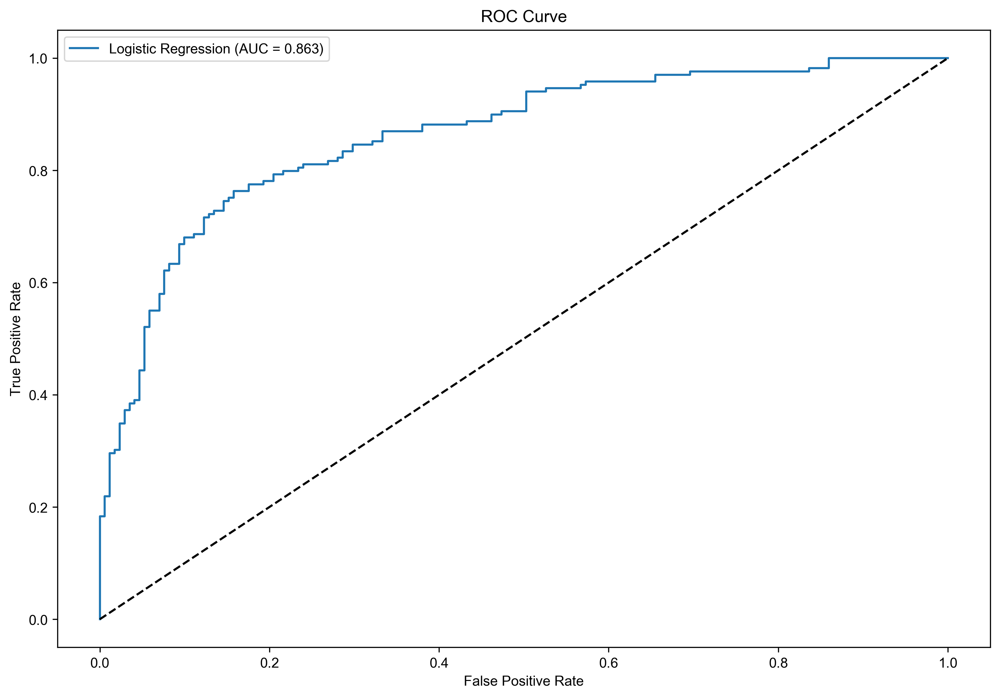

In [56]:
fpr, tpr, thresholds = roc_curve(val_y, y_pred_proba)
auc_lr = auc(fpr, tpr)
plt.figure(figsize=(12, 8), dpi=300)
plt.plot(fpr, tpr, label=f'Logistic Regression (AUC = {auc_lr:.3f})')
plt.plot([0, 1], [0, 1], 'k--')  # 绘制对角线（随机猜测基线）
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

## Feature Importance

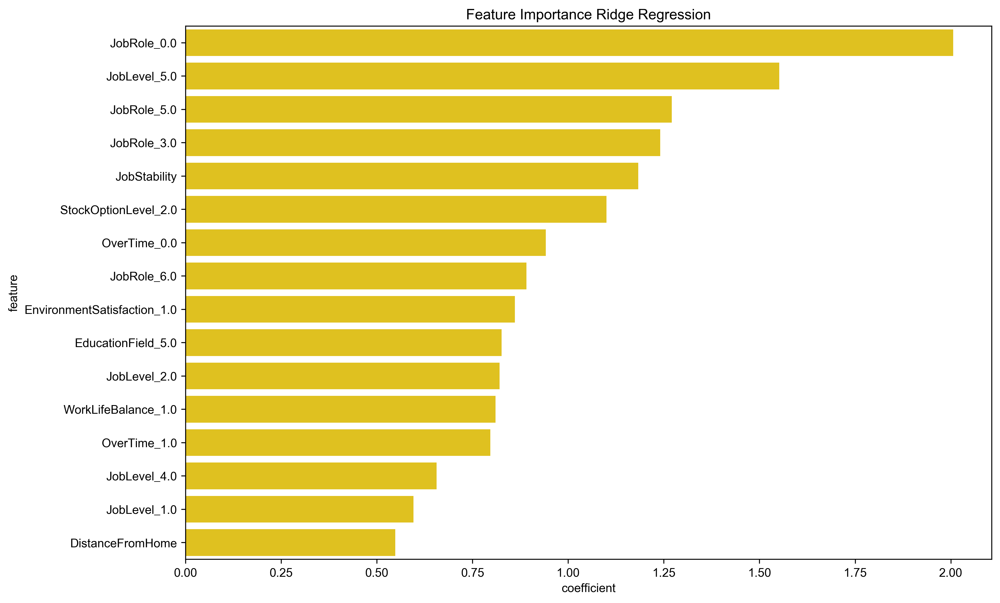

In [57]:
# 获取特征系数
coefficients = lr.coef_

features_importance = pd.DataFrame({
    # 获取模型训练时使用的特征名称
    'feature': lr.feature_names_in_,    # GET FEATURE

    'coefficient': coefficients.ravel()            # GET COEFFICIENT FOR EACH FEATURE
})

features_importance['coefficient'] = abs(features_importance['coefficient'])  # MAKE IT ABSOLUTE

features_importance = features_importance.sort_values(by='coefficient', ascending=False).reset_index(drop=True)  # DISPLAY ONLY 15 HIGHEST COEFFICIENT FEATURE


top_15 = features_importance.loc[:15,:]   # GET TOP 15 HIGHEST COEFFICIENT FOR VISUALIZE
# VISUALIZE
plt.figure(figsize=(12,8),dpi=300)
sns.barplot(x= top_15['coefficient'], y= top_15['feature'], color='gold')
plt.title('Feature Importance Ridge Regression')
plt.show()


# XGBoost

In [58]:
def xg_objective(trial):

    n_estimators    = trial.suggest_int('n_estimators', 100, 2000)
    learning_rate   = trial.suggest_uniform('learning_rate', 0.01, 1)
    max_depth       = trial.suggest_int('max_depth', 2, 20)
    min_child_weight= trial.suggest_float('min_child_weight', 0.4, 10)
    subsample       = trial.suggest_uniform('subsample', 0.35, 1)
    gamma           = trial.suggest_float('gamma', 0.1, 1)
    reg_alpha       = trial.suggest_float('reg_alpha', 0.01, 15)
    reg_lambda      = trial.suggest_float('reg_lambda', 0.01, 15)

    xgboost = xgb.XGBClassifier(
        n_estimators     = n_estimators,
        learning_rate    = learning_rate,
        max_depth        = max_depth,
        min_child_weight = min_child_weight,
        subsample        = subsample,
        gamma            = gamma,
        reg_alpha        = reg_alpha,
        reg_lambda       = reg_lambda,
        random_state     = 12
    )
    
    score = cross_val_score(estimator= xgboost, X = X_all, y = y_all, cv=ps, scoring='roc_auc')

    return score.mean()

In [ ]:
# study = optuna.create_study(direction='maximize')
# study.optimize(func= xg_objective, n_trials= 200)

[I 2025-04-18 16:45:31,268] A new study created in memory with name: no-name-9bd2cf5a-32c1-4e08-875b-482b6bfee1e2
[I 2025-04-18 16:45:31,619] Trial 0 finished with value: 0.915948648742171 and parameters: {'n_estimators': 1519, 'learning_rate': 0.4554494518753827, 'max_depth': 9, 'min_child_weight': 5.947297259524919, 'subsample': 0.7011860255912834, 'gamma': 0.5546566149498476, 'reg_alpha': 6.715518352567347, 'reg_lambda': 11.660236693322467}. Best is trial 0 with value: 0.915948648742171.
[I 2025-04-18 16:45:31,970] Trial 1 finished with value: 0.8962939894113983 and parameters: {'n_estimators': 1331, 'learning_rate': 0.4640656473625248, 'max_depth': 2, 'min_child_weight': 8.496535856063927, 'subsample': 0.36767430274092666, 'gamma': 0.5030854287570844, 'reg_alpha': 4.903510195774779, 'reg_lambda': 4.622550220512314}. Best is trial 0 with value: 0.915948648742171.
[I 2025-04-18 16:45:32,420] Trial 2 finished with value: 0.95487733139555 and parameters: {'n_estimators': 1024, 'learnin

In [ ]:
# xgb_best_params = study.best_params
# xgb_best_params
# """
#     {'n_estimators': 1872,
#     'learning_rate': 0.34960434013788755,
#     'max_depth': 18,
#     'min_child_weight': 1.4268554334551538,
#     'subsample': 0.998502962533078,
#     'gamma': 0.23237994853721106,
#     'reg_alpha': 0.599116453547919,
#     'reg_lambda': 7.045534166822569}
# """

"\n    {'n_estimators': 1872,\n    'learning_rate': 0.34960434013788755,\n    'max_depth': 18,\n    'min_child_weight': 1.4268554334551538,\n    'subsample': 0.998502962533078,\n    'gamma': 0.23237994853721106,\n    'reg_alpha': 0.599116453547919,\n    'reg_lambda': 7.045534166822569}\n"

In [ ]:
# print("Best ROC AUC:", study.best_value)

# '''
#     Best ROC AUC: 0.9842555105713
# '''

Best ROC AUC: 0.9821793141631199


'\n    Best ROC AUC: 0.9842555105713\n'

In [62]:
xgb_best_params = {'n_estimators': 1872,
                    'learning_rate': 0.34960434013788755,
                    'max_depth': 18,
                    'min_child_weight': 1.4268554334551538,
                    'subsample': 0.998502962533078,
                    'gamma': 0.23237994853721106,
                    'reg_alpha': 0.599116453547919,
                    'reg_lambda': 7.045534166822569}
xgboost = xgb.XGBClassifier(random_state=12, **xgb_best_params)
xgboost.fit(train_X, train_y)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=0.23237994853721106, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.34960434013788755, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=18, max_leaves=None,
              min_child_weight=1.4268554334551538, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=1872,
              n_jobs=None, num_parallel_tree=None, ...)

In [63]:
y_pred_proba = xgboost.predict_proba(val_X)[:,1]
y_pred = xgboost.predict(val_X)

In [64]:
print(classification_report(y_true=val_y, y_pred=y_pred))

              precision    recall  f1-score   support

           0       0.95      0.92      0.93       171
           1       0.92      0.95      0.94       169

    accuracy                           0.94       340
   macro avg       0.94      0.94      0.94       340
weighted avg       0.94      0.94      0.94       340



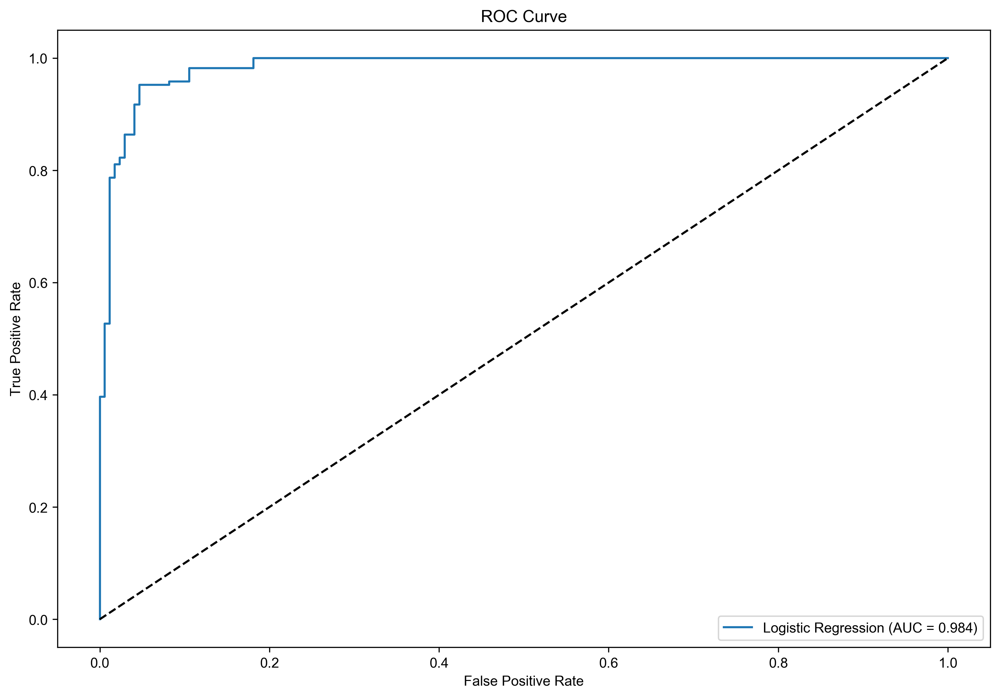

In [65]:
fpr, tpr, thresholds = roc_curve(val_y, y_pred_proba)
auc_xgb = auc(fpr, tpr)
plt.figure(figsize=(12, 8), dpi=300)
plt.plot(fpr, tpr, label=f'Logistic Regression (AUC = {auc_xgb:.3f})')
plt.plot([0, 1], [0, 1], 'k--')  # 绘制对角线（随机猜测基线）
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

## Feature Importance 

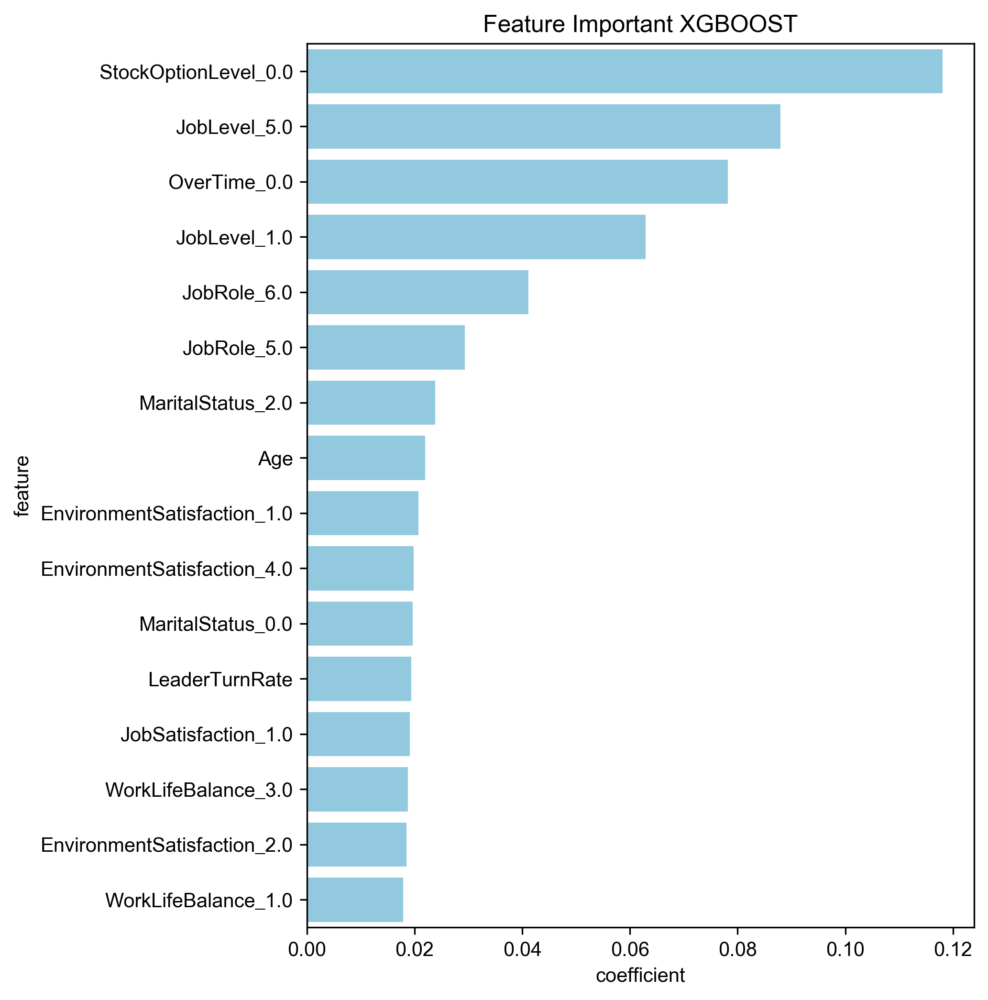

In [66]:
# SHOW FEATURE IMPORTANCES
features_importance = pd.DataFrame({
    'feature' : xgboost.feature_names_in_,   # GET FEATURE NAME
    'coefficient' : xgboost.feature_importances_   # GET COEFFICIENT
})

features_importance = features_importance.sort_values(by='coefficient', ascending= False).reset_index(drop=True) # SORT IT BY DESCENDING AND RESET INDEX

top_15 = features_importance.loc[:15, :]
plt.figure(figsize=(6,8),dpi=300)
sns.barplot(x= top_15['coefficient'], y= top_15['feature'], color='skyblue')
plt.title('Feature Important XGBOOST')
plt.show()

# Shap 分析

## Linear

In [67]:
# 创建SHAP解释器 - 对于线性模型使用LinearExplainer
lr_explainer = shap.LinearExplainer(model=lr,
                                    masker=train_X,
                                    feature_perturbation='correlation_dependent'    #考虑特征相关性，计算更精确但耗时
                                    )

# 计算SHAP值 - 使用验证集进行解释
shap_values = lr_explainer.shap_values(val_X)

Estimating transforms:   0%|          | 0/1000 [00:00<?, ?it/s]

### 特征重要性总览

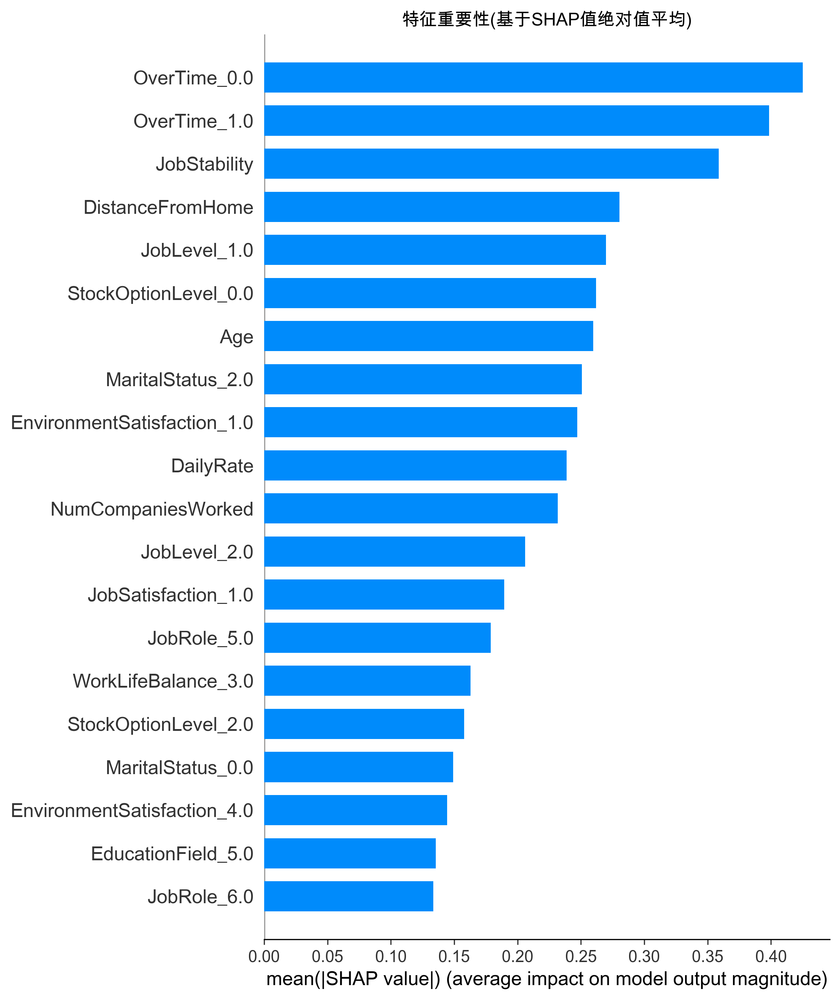

In [68]:
# 可视化分析
# 绘制特征重要性摘要图 - 按平均SHAP值绝对值排序
plt.figure(figsize=(12, 8), dpi=300)

# 特征重要性总览
shap.summary_plot(shap_values, val_X, plot_type="bar", show=False)
plt.title('特征重要性(基于SHAP值绝对值平均)')
plt.tight_layout()
plt.show()

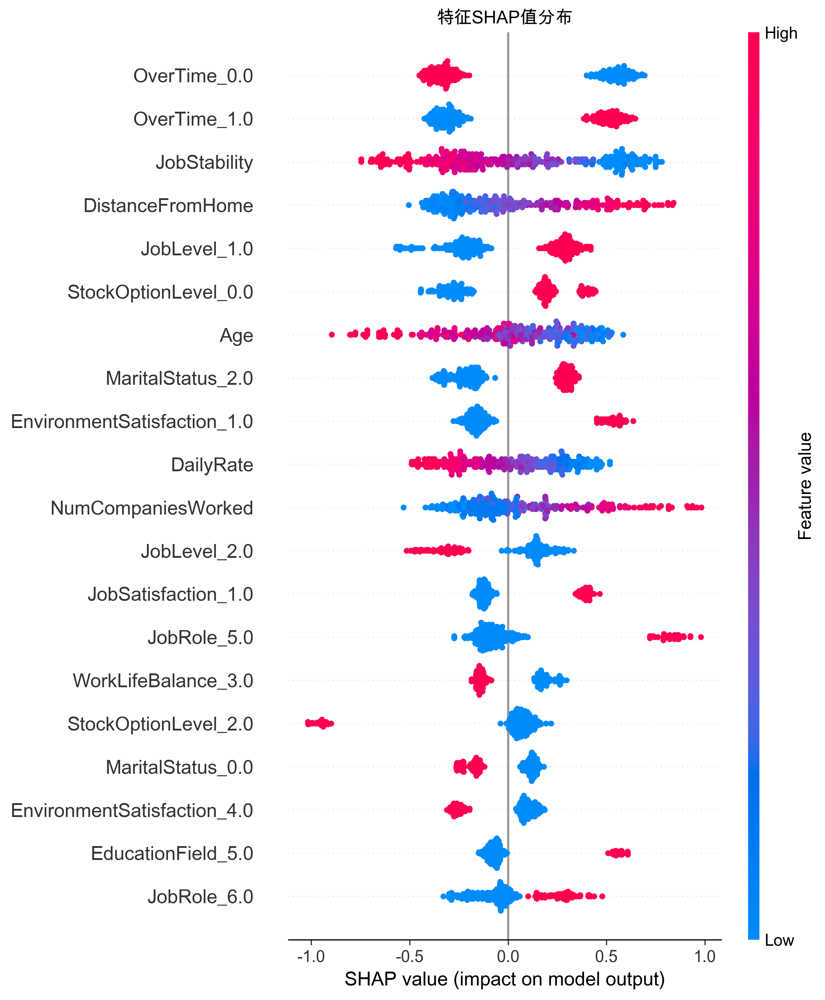

In [69]:
# 绘制SHAP值分布图 - 展示每个特征对预测的影响
plt.figure(figsize=(14, 10), dpi=300)
shap.summary_plot(shap_values, val_X, show=False)
plt.title('特征SHAP值分布')
plt.tight_layout()
plt.show()

<font size=5>坐标轴含义</font>​​

- ​​横轴（SHAP value）​​：表示特征对模型输出的​​影响方向和强度​​
​
    - ​正值（右侧）​​：该特征会​​提高​​预测概率（例如，预测员工离职时，SHAP正值表示增加离职概率）
​​
    - 负值（左侧）​​：该特征会​​降低​​预测概率
​​

绝对值越大​​，影响越显著（例如SHAP=1比SHAP=0.5影响更强）


- ​​纵轴​​：按特征重要性从上到下排列，​​顶部特征对模型影响最大​​（如OverTime_1.0可能是最重要的特征）。

<font size=5>颜色映射原理</font>​​

<font size=3.8>​​颜色代表特征值大小​​</font>​​

- ​​红色系​​：高特征值（如年龄65岁、收入10万元等），表示该样本的特征取值在数据集中处于​​前25%高位区间​​
​
- ​蓝色系​​：低特征值（如年龄25岁、收入3万元等），表示该样本的特征取值在数据集中处于​​后25%低位区间​​
​
- ​紫色/渐变过渡​​：中间值范围，具体取决于SHAP包的配色方案（默认使用红蓝渐变，也有文献建议改用单一色系避免认知干扰）
​​


<font size=3.8>颜色与SHAP值的关系​​</font>​​

- ​​红色点在右侧​​：高特征值→正向影响预测概率（例如：高血糖值会增加糖尿病风险预测）
​​
- 蓝色点在左侧​​：低特征值→负向影响预测概率（例如：低胆固醇会降低心脏病预测风险）
​
- ​颜色与方向矛盾​​：若出现低特征值（蓝色）集中在右侧（正向区），可能暗示非线性关系或数据异常，需结合业务逻辑验证


### 单个样本的解释

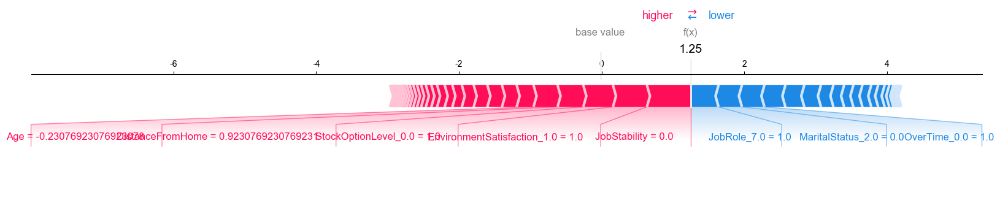

In [70]:
# 可视化第一个样本的解释
plt.Figure(figsize=(20,5), dpi=300)
shap.plots.force(
    lr_explainer.expected_value, 
    shap_values[0], 
    val_X.iloc[0,:], 
    feature_names=val_X.columns,
    matplotlib=True,  # 关键参数：启用静态图
    show=False
)
plt.show()

### 依赖图

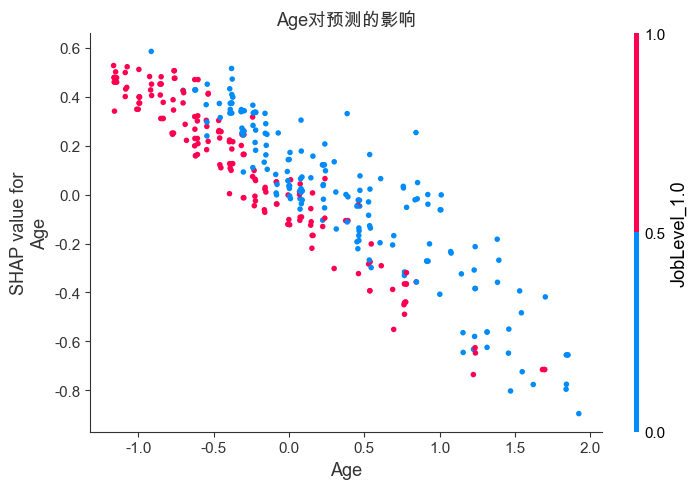

In [71]:
# 绘制依赖图
# 演示特征 Age 对预测的影响
plt.Figure(figsize=(12,8), dpi=300)
shap.dependence_plot(
    ind='Age',                  # 目标特征（X中的列名或索引）
    shap_values=shap_values,    # SHAP值矩阵
    features=val_X,                 # 原始特征数据
    show=False,                 # 禁止自动显示图形
    title='Age对预测的影响',
    x_jitter=0.3                # 防止点重叠的横向抖动参数
)
plt.tight_layout()
plt.show()

### 决策图

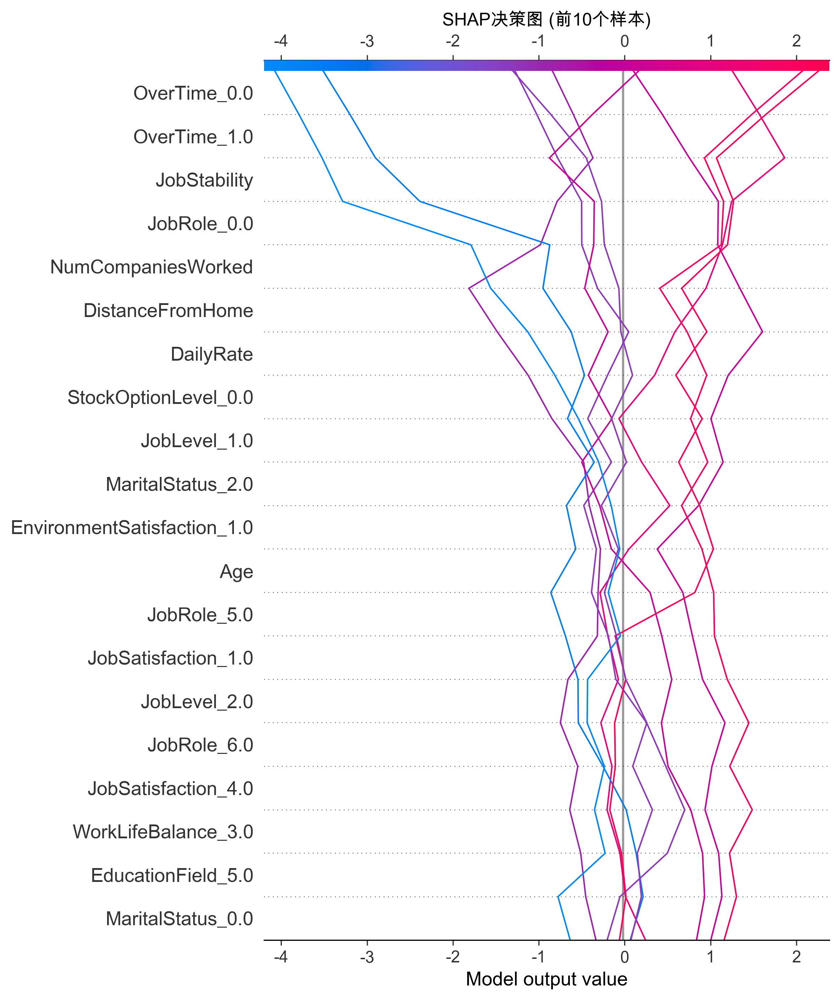

In [72]:
# 创建决策图(decision plot)
plt.figure(figsize=(12, 8), dpi=300)
shap.decision_plot(lr_explainer.expected_value, shap_values[:10], val_X.iloc[:10], show=False)
plt.title('SHAP决策图 (前10个样本)')
plt.tight_layout()
plt.show()

## Tree

In [73]:
xgb_explainer = shap.TreeExplainer(model=xgboost)
shap_values = xgb_explainer.shap_values(val_X)

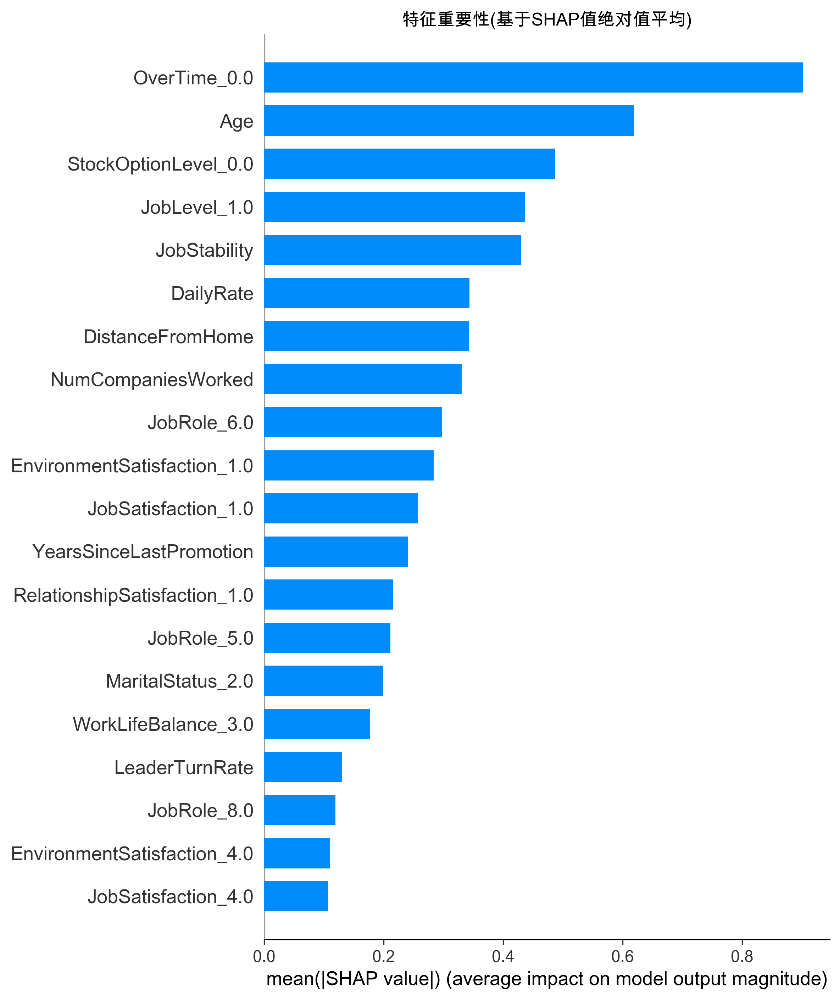

In [74]:
plt.figure(figsize=(12, 8), dpi=300)

shap.summary_plot(shap_values, val_X, plot_type="bar", show=False)
plt.title('特征重要性(基于SHAP值绝对值平均)')
plt.tight_layout()
plt.show()

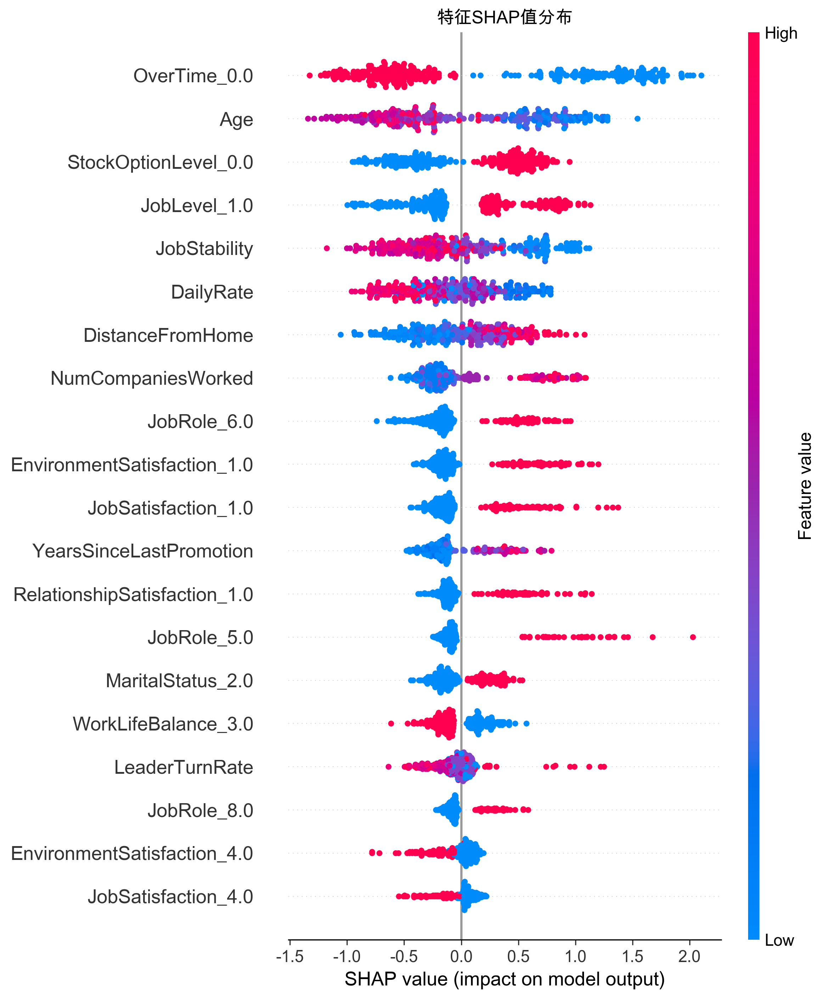

In [75]:
plt.figure(figsize=(14, 10), dpi=300)
shap.summary_plot(shap_values, val_X, show=False)
plt.title('特征SHAP值分布')
plt.tight_layout()
plt.show()

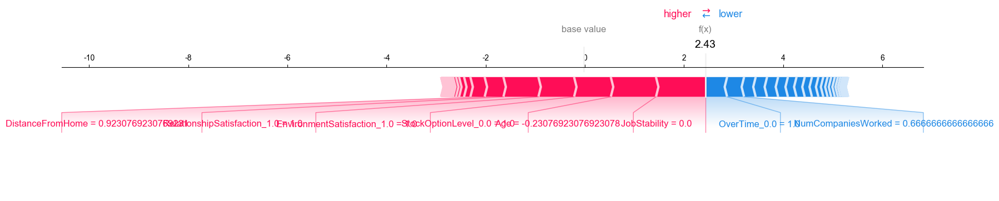

In [76]:
plt.Figure(figsize=(20,5), dpi=300)
shap.plots.force(
    lr_explainer.expected_value, 
    shap_values[0], 
    val_X.iloc[0,:], 
    feature_names=val_X.columns,
    matplotlib=True, 
    show=False
)
plt.show()

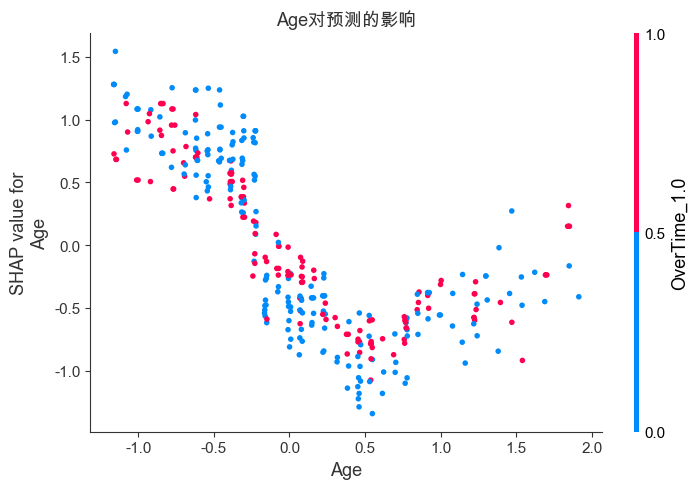

In [77]:
plt.Figure(figsize=(12,8), dpi=300)
shap.dependence_plot(
    ind='Age',                  
    shap_values=shap_values,   
    features=val_X,                
    show=False,                
    title='Age对预测的影响',
    x_jitter=0.3                
)
plt.tight_layout()
plt.show()

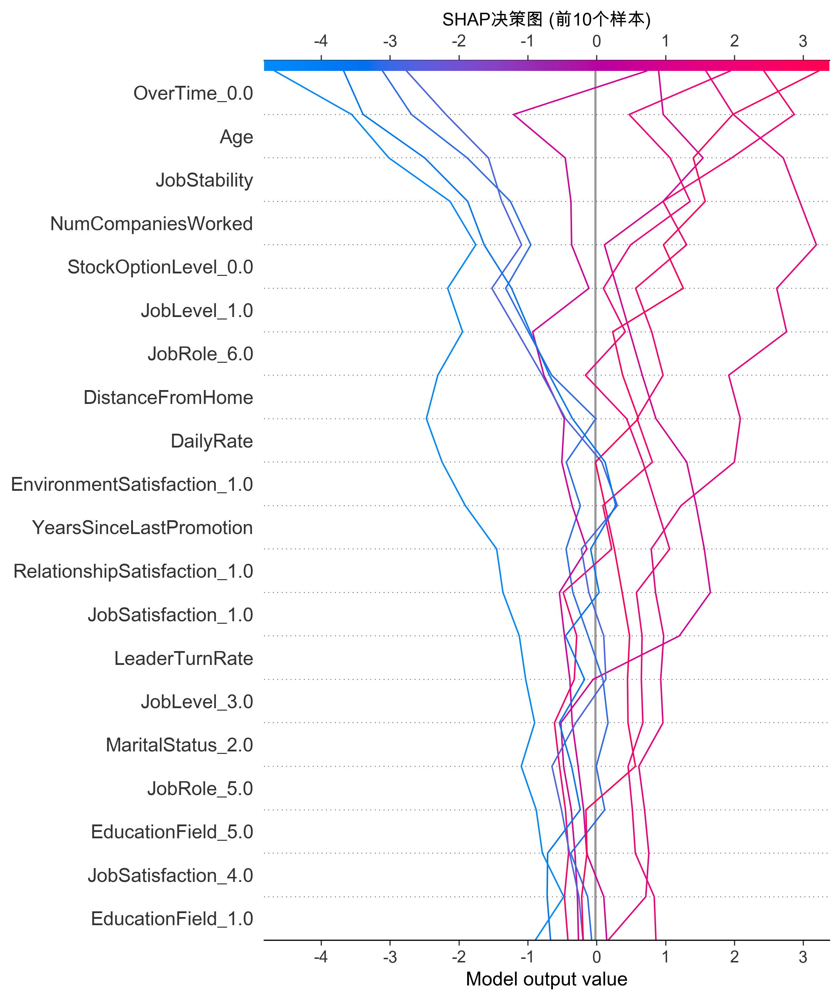

In [78]:
plt.figure(figsize=(12, 8), dpi=300)
shap.decision_plot(lr_explainer.expected_value, shap_values[:10], val_X.iloc[:10], show=False)
plt.title('SHAP决策图 (前10个样本)')
plt.tight_layout()
plt.show()